# Financial Analysis on Historical Stock Data

**This section covers how to download historical financial data for stocks and indexes, how the manipulate and format this data, a number of different visualization techniques, and how to analyze the collected data in various ways.**

In [148]:
import pandas as pd
import numpy as np
import datetime
from datetime import datetime
from pandas_datareader import data as web
import fix_yahoo_finance as yf # https://pypi.python.org/pypi/fix-yahoo-finance
import matplotlib.pyplot as plt

%matplotlib inline

plt.style.use('default')

# Formatting options
pd.set_option('display.notebook_repr_html', True)
pd.set_option('display.max_rows', 15) 
#pd.set_option('display.width', 75) 
pd.set_option('precision', 5)
yf.pdr_override()

# Note:
# If data is not being obtained then consider restarting the kernal and running all cells again.

## Obtaining historical stock and index data from Yahoo! Finance

**The following commands will obtain the historical quotes for Nvidia (NVDA) from 1/1/2005 to 12/31/2015.**

In [149]:
start = datetime(2005, 1, 1)
end = datetime(2015, 12, 31)
nvda = web.get_data_yahoo('NVDA', start, end)
# Show the first five dates and accompanying information.
nvda.head()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2005-01-03,8.12667,8.24000,7.82667,7.86000,7.28303,26667900
2005-01-04,7.91667,7.93000,7.37000,7.49000,6.94019,19755600
2005-01-05,7.41000,7.65000,7.37000,7.56000,7.00505,18120300
2005-01-06,7.69333,7.78333,7.43333,7.48667,6.93710,14089200
2005-01-07,7.50333,7.56000,7.23333,7.34333,6.80429,19077300


**Acquiring historical quotes from different companies in various industry sectors and storing that information in a DataFrame for later analysis use.**

In [150]:
# This function will obtain the quotes for a list of stock tickers and return the results in a single DataFrame.
def get(tickers, start, end):
    def data(ticker):
        return web.get_data_yahoo(ticker, start, end)
    datas = [data(ticker) for ticker in tickers]
    return pd.concat(datas, keys=tickers, names=['Ticker', 'Date'])

**The following is a selection of sectors that contain some proposed companies with varying performances. The analysis later on will determine if these assertions are true given the time period of collected data mentioned before.**

#### Sector: Energy
**High Performance:** HAL - Halliburton Company

**Low Performance:** APA - Apache Corporation 

**Average Performance:** CVX - Chevron Corporation  

**Average Performance:** XOM - Exxon Mobil Corporation  

#### Sector: Information Technology	
**High Performance:** NVDA - Nvidia   

**Low Performance:** CSCO - Cisco Systems 

**Average Performance:** ADSK - Autodesk  

**Average Performance:** ADBE - Adobe Systems  


#### Sector: Health Care
**High Performance:** ABT - Abbott Laboratories

**Low Performance:** ZBH - Zimmer Biomet Holdings 

**Average Performance:** JNJ - Johnson & Johnson

**Average Performance:** BAX - Baxter International Incorporated

In [151]:
# Download the relevant data for all of the companies listed.
tickers = ['NVDA', 'CSCO', 'ADSK', 'ADBE', 'HAL', 'APA', 'CVX', 'XOM', 'ABT', 'ZBH', 'JNJ', 'BAX']
stocks_data = get(tickers, start, end)

[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded
[*********************100%***********************]  1 of 1 downloaded


In [152]:
stocks_data.head()

Open     High      Low    Close  Adj Close  \
Ticker Date                                                        
NVDA   2005-01-03  8.12667  8.24000  7.82667  7.86000    7.28303   
       2005-01-04  7.91667  7.93000  7.37000  7.49000    6.94019   
       2005-01-05  7.41000  7.65000  7.37000  7.56000    7.00505   
       2005-01-06  7.69333  7.78333  7.43333  7.48667    6.93710   
       2005-01-07  7.50333  7.56000  7.23333  7.34333    6.80429   

                     Volume  
Ticker Date                  
NVDA   2005-01-03  26667900  
       2005-01-04  19755600  
       2005-01-05  18120300  
       2005-01-06  14089200  
       2005-01-07  19077300

In [153]:
stocks_data.tail()

Open   High    Low  Close  Adj Close   Volume
Ticker Date                                                      
BAX    2015-12-24  38.06  38.38  38.06  38.15   37.23533  2762200
       2015-12-28  38.02  38.31  37.86  38.14   37.22557  2698700
       2015-12-29  38.39  38.69  38.30  38.56   37.63551  3281800
       2015-12-30  38.48  38.65  37.99  38.05   37.13774  2909400
       2015-12-31  37.86  38.55  37.72  38.15   37.23533  3521700

**Acquiring historical data from the Standard & Poor's 500 Index.**

In [154]:
sp500 = web.get_data_yahoo('^GSPC', start, end)
sp500.head()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2005-01-03,1211.92004,1217.80005,1200.31995,1202.07996,1202.07996,1510800000
2005-01-04,1202.07996,1205.83997,1185.39001,1188.05005,1188.05005,1721000000
2005-01-05,1188.05005,1192.72998,1183.71997,1183.73999,1183.73999,1738900000
2005-01-06,1183.73999,1191.63000,1183.27002,1187.89001,1187.89001,1569100000
2005-01-07,1187.89001,1192.19995,1182.16003,1186.18994,1186.18994,1477900000


## Visualizing time-series data

**Extract and store the adjusted closing values for each stock.**

In [155]:
# Select the Adj Close column and reset the index to move the dates.
adj_closing_prices = stocks_data[['Adj Close']].reset_index()
# Display the first ten rows for the adjusted closing values.
adj_closing_prices[:10]

,Ticker,Date,Adj Close
0,NVDA,2005-01-03,7.28303
1,NVDA,2005-01-04,6.94019
2,NVDA,2005-01-05,7.00505
3,NVDA,2005-01-06,6.93710
4,NVDA,2005-01-07,6.80429
5,NVDA,2005-01-10,6.81973
6,NVDA,2005-01-11,6.60970
7,NVDA,2005-01-12,6.55411
8,NVDA,2005-01-13,6.62206
9,NVDA,2005-01-14,6.64368


In [156]:
# Pivot the Date values into the index and the Ticker values into a column.
daily_adj_closing_prices = adj_closing_prices.pivot('Date', 'Ticker', 'Adj Close')
# Display the first five daily adjusted closing prices for all companies.
daily_adj_closing_prices.head()

Ticker,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,
2005-01-03,12.19251,30.83327,37.41071,42.06638,12.07118,15.71779,32.01373,15.88393,42.90309,7.28303,35.50570,75.01142
2005-01-04,12.06972,30.01858,34.98196,41.72659,12.04678,15.09949,31.79359,15.90063,42.76668,6.94019,35.26469,74.98308
2005-01-05,11.93127,29.85364,35.25182,41.58718,12.17579,15.10762,32.00116,15.70010,42.73938,7.00505,35.08039,74.39719
2005-01-06,12.20035,29.35883,35.08190,42.25807,12.22460,15.33542,32.53576,15.98001,42.86216,6.93710,35.52695,75.25712
2005-01-07,12.40934,29.37882,34.28232,41.98797,12.37104,15.22965,32.17096,15.86721,42.70528,6.80429,35.29304,75.12482


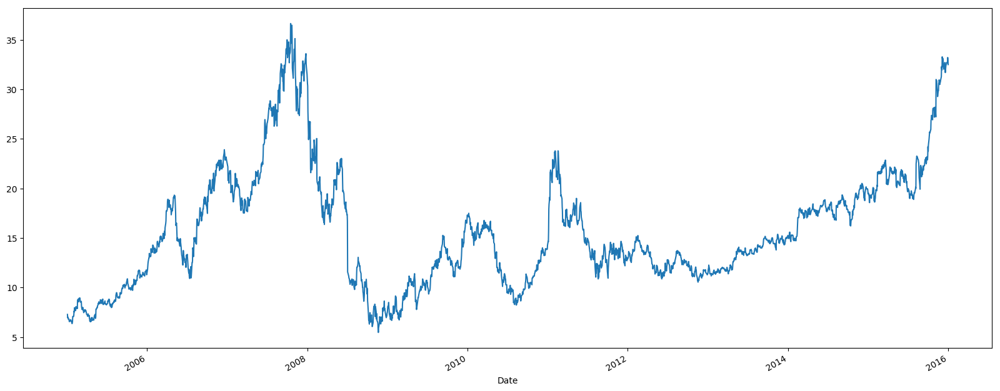

In [157]:
# Select a company's specific column to plot a single stock's adjusted closing price.
daily_adj_closing_prices['NVDA'].plot(figsize=(20, 8)) 

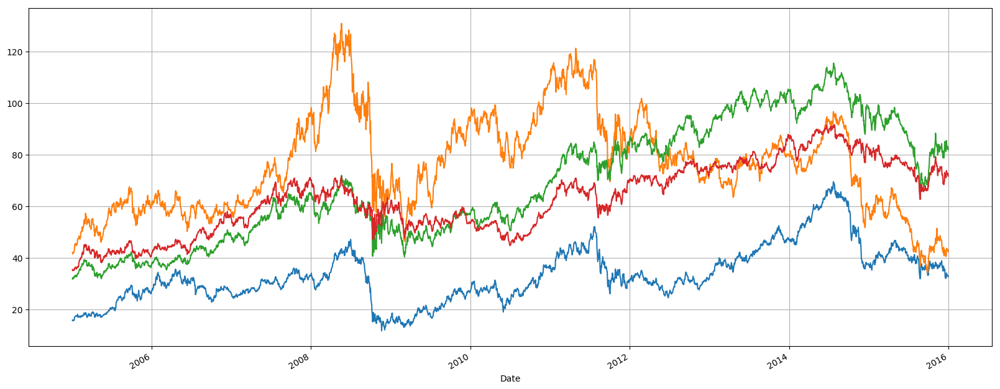

In [158]:
# Executing the commands sequentially will result in one graph that includes the specified stocks. 
daily_adj_closing_prices['HAL'].plot(figsize=(20, 8), grid=True) # Adds grid
daily_adj_closing_prices['APA'].plot(figsize=(20, 8), grid=True)
daily_adj_closing_prices['CVX'].plot(figsize=(20, 8), grid=True)
daily_adj_closing_prices['XOM'].plot(figsize=(20, 8), grid=True)

Text(0.5,1,'Information Technology Sector Daily Adjusted Closing Prices (NVDA, CSCO, ADSK, ADBE) from 2005 - 2015')

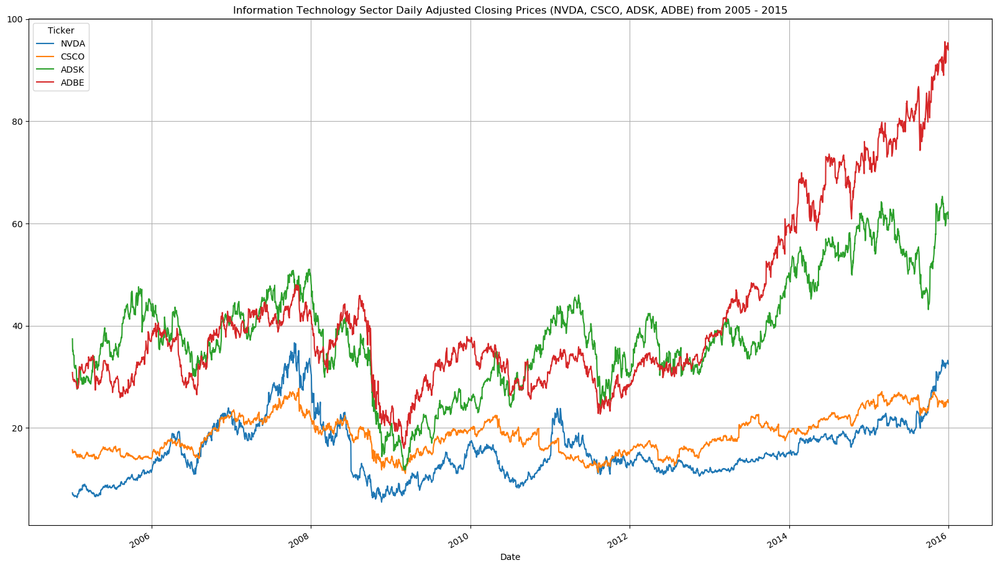

In [159]:
# Alternative:
# Daily adjusted closing prices for the information technology sector.
information_technology_sector = daily_adj_closing_prices[['NVDA', 'CSCO', 'ADSK', 'ADBE']].copy()

# Display the sector data.
information_technology_sector.plot(figsize=(20, 12), grid=True)
plt.title('Information Technology Sector Daily Adjusted Closing Prices (NVDA, CSCO, ADSK, ADBE) from 2005 - 2015')

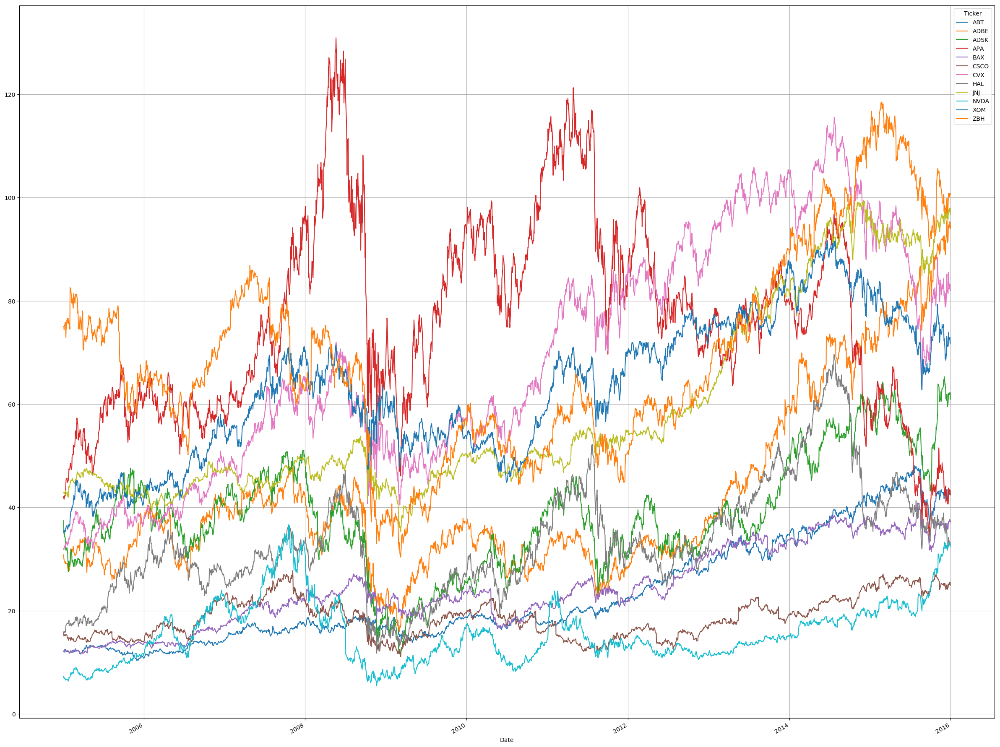

In [160]:
# Plot all of the adjusted closing prices for every stock in the DataFrame.
daily_adj_closing_prices.plot(figsize=(30, 25), grid=True) # figsize values can be modified to adjust sizing.

In [161]:
# Use %matplotlib notebook before the plot function to display an interactive chart.
# If this does not work as intended then execute 'conda install pyqt' in your Anaconda Prompt.
# %matplotlib inline will return charts back to normal.

## Plotting trading volume data

**The following commands will allow the plotting of volume-series data for a specified stock.**

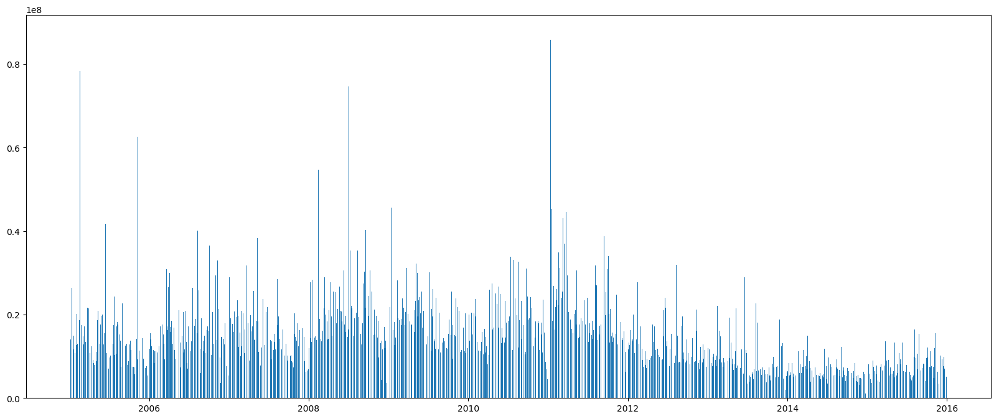

In [162]:
nvdaVolume = stocks_data.Volume.loc['NVDA']
plt.bar(nvdaVolume.index, nvdaVolume)
plt.gcf().set_size_inches(20, 8)

## Combining adjusted closing prices and volumes

**Plotting a stock's trading volume relative to its adjusted closing price.**

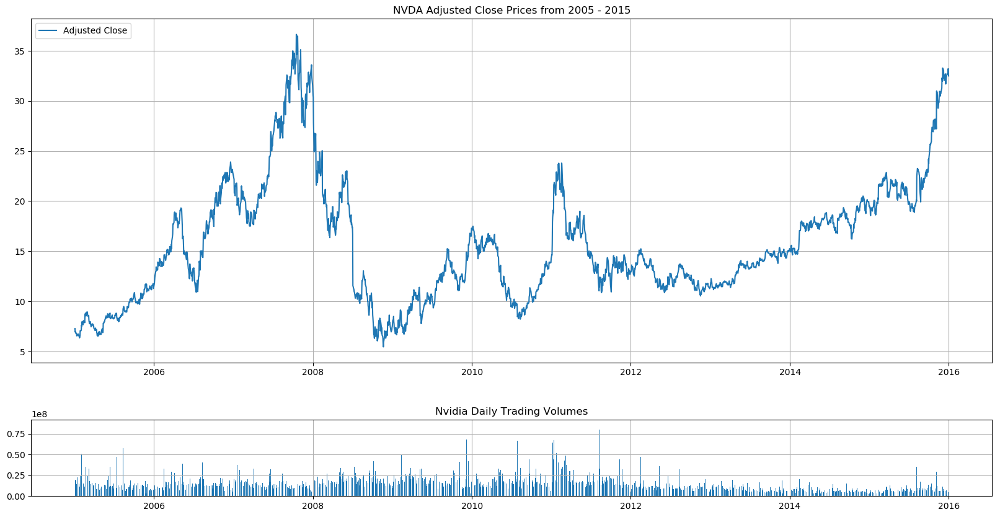

In [163]:
top = plt.subplot2grid((4, 4), (0, 0), rowspan = 3, colspan = 4)
top.plot(daily_adj_closing_prices.index, daily_adj_closing_prices.NVDA, label = 'Adjusted Close')
top.grid(True)
plt.title('NVDA Adjusted Close Prices from 2005 - 2015')
plt.legend(loc = 2)
bottom = plt.subplot2grid((4, 4), (3, 0), rowspan = 1, colspan = 4)
bottom.bar(nvdaVolume.index, nvdaVolume)
bottom.grid(True)
plt.title('Nvidia Daily Trading Volumes')
plt.gcf().set_size_inches(20, 10)
plt.subplots_adjust(hspace = 0.75)

## Plotting candlestick charts

**These charts are used to illustrate price movments of a stock over time.**

**Information on these types of charts: http://stockcharts.com/school/doku.php?id=chart_school:chart_analysis:introduction_to_candlesticks**

In [164]:
# Obtain subset data for Nvidia from December 2012.
subset_data = stocks_data.loc['NVDA'].loc['2012-12':'2012-12'].reset_index()
subset_data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2012-12-03,12.12,12.12,11.72,11.75,10.95772,9784500
1,2012-12-04,11.77,12.12,11.70,12.10,11.28412,13201700
2,2012-12-05,12.00,12.08,11.79,11.96,11.15356,15825600
3,2012-12-06,11.93,12.06,11.89,11.98,11.17221,10322400
4,2012-12-07,11.99,12.05,11.82,11.96,11.15356,8457200
5,2012-12-10,11.96,12.45,11.93,12.36,11.52659,12841100
6,2012-12-11,12.40,12.81,12.37,12.65,11.79704,20418100
...,...,...,...,...,...,...,...
13,2012-12-20,12.70,12.71,12.50,12.64,11.78771,8358300
14,2012-12-21,12.47,12.47,12.21,12.35,11.51726,11554300


**The data must now be formatted in a couple ways before it can used as an input.**

In [165]:
# Date formatting.
import matplotlib.dates as mdates
subset_data['date_num'] = subset_data.Date.apply(lambda date: mdates.date2num(date.to_pydatetime()))
subset_data

,Date,Open,High,Low,Close,Adj Close,Volume,date_num
0,2012-12-03,12.12,12.12,11.72,11.75,10.95772,9784500,734840.0
1,2012-12-04,11.77,12.12,11.70,12.10,11.28412,13201700,734841.0
2,2012-12-05,12.00,12.08,11.79,11.96,11.15356,15825600,734842.0
3,2012-12-06,11.93,12.06,11.89,11.98,11.17221,10322400,734843.0
4,2012-12-07,11.99,12.05,11.82,11.96,11.15356,8457200,734844.0
5,2012-12-10,11.96,12.45,11.93,12.36,11.52659,12841100,734847.0
6,2012-12-11,12.40,12.81,12.37,12.65,11.79704,20418100,734848.0
...,...,...,...,...,...,...,...,...
13,2012-12-20,12.70,12.71,12.50,12.64,11.78771,8358300,734857.0
14,2012-12-21,12.47,12.47,12.21,12.35,11.51726,11554300,734858.0


In [166]:
# Formatting subset_data into a list of tuples.
tuples_subset_data = [tuple(x) for x in subset_data[['date_num', 'Open', 'High', 'Low', 'Close']].values]
tuples_subset_data

[(734840.0, 12.12, 12.12, 11.72, 11.75),
 (734841.0, 11.77, 12.12, 11.7, 12.1),
 (734842.0, 12.0, 12.08, 11.79, 11.96),
 (734843.0, 11.93, 12.06, 11.89, 11.98),
 (734844.0, 11.99, 12.05, 11.82, 11.96),
 (734847.0, 11.96, 12.45, 11.93, 12.36),
 (734848.0, 12.4, 12.81, 12.37, 12.65),
 (734849.0, 12.69, 12.76, 12.47, 12.52),
 (734850.0, 12.5, 12.77, 12.41, 12.53),
 (734851.0, 12.58, 12.72, 12.49, 12.59),
 (734854.0, 12.56, 12.63, 12.35, 12.54),
 (734855.0, 12.54, 12.7, 12.5, 12.56),
 (734856.0, 12.65, 12.8, 12.6, 12.65),
 (734857.0, 12.7, 12.71, 12.5, 12.64),
 (734858.0, 12.47, 12.47, 12.21, 12.35),
 (734861.0, 12.34, 12.38, 12.21, 12.25),
 (734863.0, 12.22, 12.42, 12.19, 12.24),
 (734864.0, 12.26, 12.28, 12.02, 12.16),
 (734865.0, 12.05, 12.29, 12.03, 12.1),
 (734868.0, 12.06, 12.31, 12.03, 12.26)]

**Format the x-axis before plotting.**

**Documentation: https://matplotlib.org/api/dates_api.html**

In [167]:
# Specifies the weekly format on the x-axis.
from matplotlib.dates import DateFormatter
week_format = DateFormatter('%b %d')

In [168]:
# Specifies the days that should be labeled on the x-axis. In this case mondays.
from matplotlib.dates import WeekdayLocator, MONDAY
mondays_locator = WeekdayLocator(MONDAY)

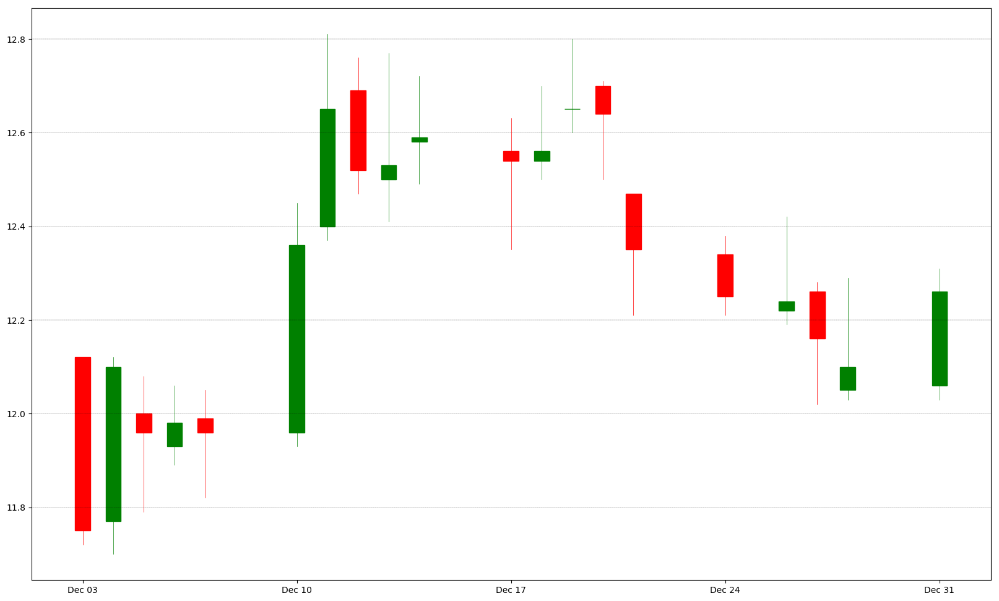

In [169]:
from matplotlib.finance import candlestick_ohlc

# Plot the candlestick chart.
figure, axis = plt.subplots(figsize=(20, 12)) 
axis.xaxis.set_major_locator(mondays_locator)
axis.xaxis.set_major_formatter(week_format)
axis.yaxis.grid(color='black', linestyle='--', linewidth=.2)
candlestick_ohlc(axis, tuples_subset_data, width=0.5, colorup='g', colordown='r');

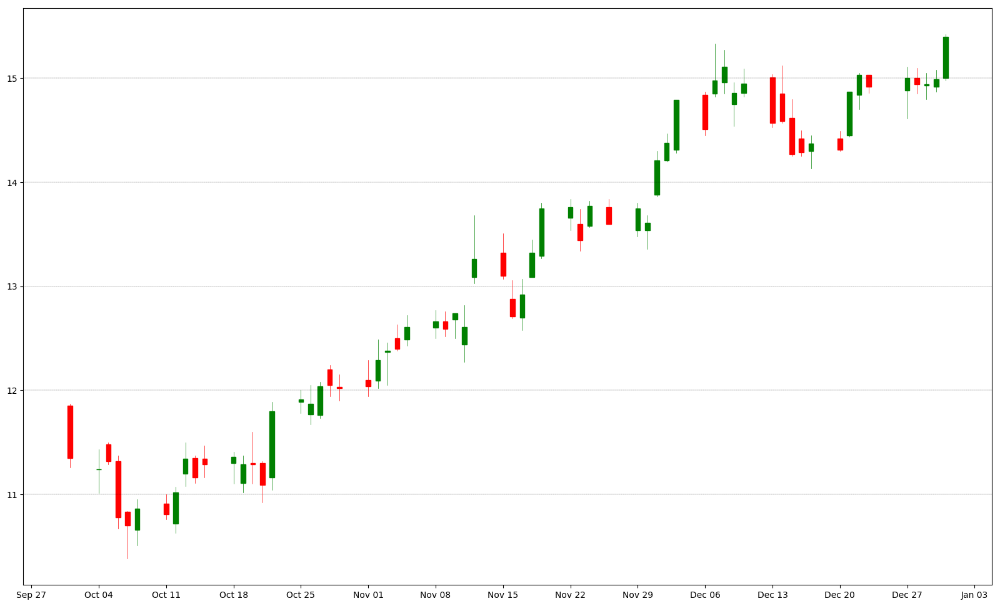

In [170]:
# Display data for Nvidia from October to December in 2010.
subset_data = stocks_data.loc['NVDA'].loc['2010-10':'2010-12'].reset_index()
subset_data['date_num'] = subset_data.Date.apply(lambda date: mdates.date2num(date.to_pydatetime()))
tuples_subset_data = [tuple(x) for x in subset_data[['date_num', 'Open', 'High', 'Low', 'Close']].values]
week_format = DateFormatter('%b %d')
mondays_locator = WeekdayLocator(MONDAY)

figure, axis = plt.subplots(figsize=(20, 12)) 
axis.xaxis.set_major_locator(mondays_locator)
axis.xaxis.set_major_formatter(week_format)
axis.yaxis.grid(color='black', linestyle='--', linewidth=.2)
candlestick_ohlc(axis, tuples_subset_data, width=0.5, colorup='g', colordown='r');

## Calculating daily change in value

**The following will determine the percentage change in the value of a stock over one day.**

In [171]:
# Calculate the adjusted closing price percentage change for NVDA between 2005-01-03 and 2005-01-04
NVDA_p1 = daily_adj_closing_prices.iloc[0]['NVDA']  # 2005-01-03
NVDA_p2 = daily_adj_closing_prices.iloc[1]['NVDA']  # 2005-01-04
percentage_return = (NVDA_p2 - NVDA_p1) / NVDA_p1
# Alternative
# percentage_return = NVDA_p2 / NVDA_p1 - 1 

NVDA_p1, NVDA_p2, percentage_return # -4.7% change

(7.28303, 6.940189999999999, -0.047073814058159955)

In [172]:
# Finding the percentage return for all of the stocks in the daily_adj_closing_prices DataFrame.
daily_returns_for_stock_data = daily_adj_closing_prices.iloc[1:] / daily_adj_closing_prices.iloc[:-1].values - 1

# Display first 10 rows of returns.
daily_returns_for_stock_data.loc[:,'ABT':][:10]

Ticker,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,
2005-01-04,-0.01007,-0.02642,-0.06492,-0.00808,-0.00202,-0.03934,-0.00688,0.00105,-0.00318,-0.04707,-0.00679,-0.00038
2005-01-05,-0.01147,-0.00549,0.00771,-0.00334,0.01071,0.00054,0.00653,-0.01261,-0.00064,0.00935,-0.00523,-0.00781
2005-01-06,0.02255,-0.01657,-0.00482,0.01613,0.00401,0.01508,0.01671,0.01783,0.00287,-0.00970,0.01273,0.01156
2005-01-07,0.01713,0.00068,-0.02279,-0.00639,0.01198,-0.00690,-0.01121,-0.00706,-0.00366,-0.01915,-0.00658,-0.00176
2005-01-10,0.00968,0.00068,-0.00175,0.00706,-0.00141,0.00000,0.00450,-0.00369,0.00783,0.00227,0.00382,0.00956
2005-01-11,-0.01835,-0.01190,-0.05403,0.00865,0.00367,-0.00427,0.00039,0.00925,-0.00349,-0.03080,-0.00260,-0.00424
2005-01-12,0.00842,0.01480,-0.01297,0.01553,-0.00731,0.01556,0.02121,0.03483,0.00700,-0.00841,0.01484,-0.00288
2005-01-13,-0.01918,-0.01289,-0.00594,0.02877,-0.02550,-0.00792,-0.00819,0.02733,-0.02132,0.01037,-0.00079,-0.03175
2005-01-14,0.00478,0.00017,-0.00315,0.01838,-0.00145,0.00532,0.00461,0.01724,0.01178,0.00326,0.01029,0.02087


**An alternative and easier way is to just use the .pct_change() method.**

In [173]:
daily_percentage_change_for_stock_data = daily_adj_closing_prices.pct_change()
daily_percentage_change_for_stock_data.iloc[:,:][:10]

Ticker,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,
2005-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-01-04,-0.01007,-0.02642,-0.06492,-0.00808,-0.00202,-0.03934,-0.00688,0.00105,-0.00318,-0.04707,-0.00679,-0.00038
2005-01-05,-0.01147,-0.00549,0.00771,-0.00334,0.01071,0.00054,0.00653,-0.01261,-0.00064,0.00935,-0.00523,-0.00781
2005-01-06,0.02255,-0.01657,-0.00482,0.01613,0.00401,0.01508,0.01671,0.01783,0.00287,-0.00970,0.01273,0.01156
2005-01-07,0.01713,0.00068,-0.02279,-0.00639,0.01198,-0.00690,-0.01121,-0.00706,-0.00366,-0.01915,-0.00658,-0.00176
2005-01-10,0.00968,0.00068,-0.00175,0.00706,-0.00141,0.00000,0.00450,-0.00369,0.00783,0.00227,0.00382,0.00956
2005-01-11,-0.01835,-0.01190,-0.05403,0.00865,0.00367,-0.00427,0.00039,0.00925,-0.00349,-0.03080,-0.00260,-0.00424
2005-01-12,0.00842,0.01480,-0.01297,0.01553,-0.00731,0.01556,0.02121,0.03483,0.00700,-0.00841,0.01484,-0.00288
2005-01-13,-0.01918,-0.01289,-0.00594,0.02877,-0.02550,-0.00792,-0.00819,0.02733,-0.02132,0.01037,-0.00079,-0.03175


In [174]:
# Replace the 'NaN' values with zero and just display the information from the first three stocks.
daily_percentage_change_for_stock_data.fillna(0, inplace=True)
daily_percentage_change_for_stock_data.iloc[:10, :3]

Ticker,ABT,ADBE,ADSK
Date,,,
2005-01-03,0.00000,0.00000,0.00000
2005-01-04,-0.01007,-0.02642,-0.06492
2005-01-05,-0.01147,-0.00549,0.00771
2005-01-06,0.02255,-0.01657,-0.00482
2005-01-07,0.01713,0.00068,-0.02279
2005-01-10,0.00968,0.00068,-0.00175
2005-01-11,-0.01835,-0.01190,-0.05403
2005-01-12,0.00842,0.01480,-0.01297
2005-01-13,-0.01918,-0.01289,-0.00594


In [175]:
# Obtaining daily percentage change data for one particular stock.
daily_percentage_change_for_stock_data.XOM # XOM
# Alternative:
# daily_percentage_change_for_stock_data['XOM']

Date
2005-01-03    0.00000
2005-01-04   -0.00679
2005-01-05   -0.00523
2005-01-06    0.01273
2005-01-07   -0.00658
2005-01-10    0.00382
2005-01-11   -0.00260
               ...   
2015-12-22    0.00505
2015-12-23    0.03271
2015-12-24   -0.01072
2015-12-28   -0.00744
2015-12-29    0.00533
2015-12-30   -0.01326
2015-12-31   -0.00205
Name: XOM, Length: 2769, dtype: float64

## Calculating daily cumulative rate of returns

**Investors use cumulative returns to determine the value of an investment after the investment has been made. It gives periodic insights into the return value relative to the day of investment, and it can be calculated with the .cumprod() method.**

**More information: https://www.investopedia.com/terms/c/cumulativereturn.asp**

In [190]:
daily_cumulative_returns = (1 + daily_percentage_change_for_stock_data).cumprod()

# Display extended rows and columns.
pd.options.display.max_rows = 25 # Extends display limit for rows to 25.
daily_cumulative_returns.iloc[:,:][:]

# The following downloads the data to the local machine and can be used for any DataFrame.
# daily_cumulative_returns.to_csv('daily_cumulative_returns.csv')

Ticker,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,
2005-01-03,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
2005-01-04,0.98993,0.97358,0.93508,0.99192,0.99798,0.96066,0.99312,1.00105,0.99682,0.95293,0.99321,0.99962
2005-01-05,0.97857,0.96823,0.94229,0.98861,1.00867,0.96118,0.99961,0.98843,0.99618,0.96183,0.98802,0.99181
2005-01-06,1.00064,0.95218,0.93775,1.00456,1.01271,0.97567,1.01631,1.00605,0.99905,0.95250,1.00060,1.00328
2005-01-07,1.01778,0.95283,0.91638,0.99814,1.02484,0.96894,1.00491,0.99895,0.99539,0.93427,0.99401,1.00151
2005-01-10,1.02764,0.95348,0.91477,1.00518,1.02340,0.96894,1.00943,0.99527,1.00318,0.93639,0.99780,1.01109
2005-01-11,1.00879,0.94213,0.86535,1.01388,1.02715,0.96480,1.00982,1.00447,0.99968,0.90755,0.99521,1.00680
2005-01-12,1.01728,0.95607,0.85413,1.02962,1.01964,0.97981,1.03124,1.03945,1.00668,0.89992,1.00998,1.00391
2005-01-13,0.99777,0.94375,0.84905,1.05924,0.99365,0.97205,1.02279,1.06786,0.98521,0.90925,1.00918,0.97203


Text(0.5,1,'Energy Sector Daily Cumulative Returns (HAL, APA, CVX, XOM) from 2005 - 2015')

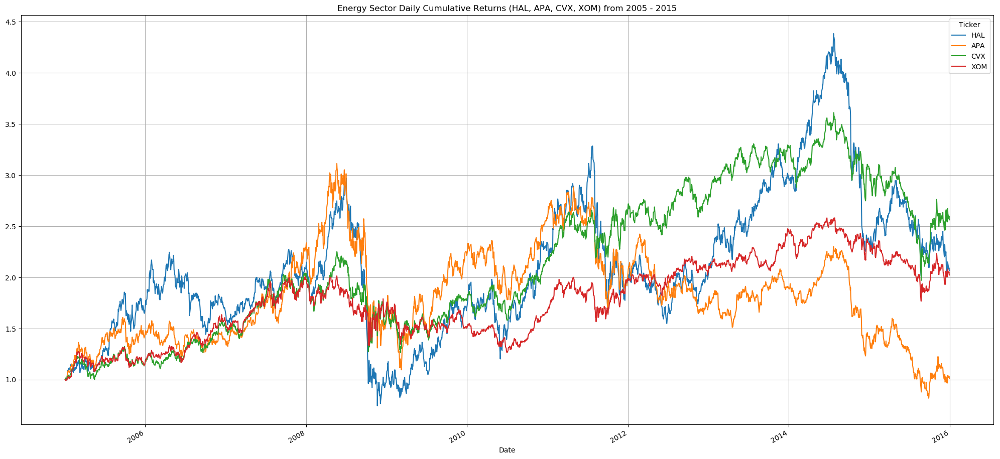

In [177]:
# Daily cumulative returns for the various sectors.
energy_sector = daily_cumulative_returns[['HAL', 'APA', 'CVX', 'XOM']].copy()
information_technology_sector = daily_cumulative_returns[['NVDA', 'CSCO', 'ADSK', 'ADBE']].copy()
health_care_sector = daily_cumulative_returns[['ABT', 'ZBH', 'JNJ', 'BAX']].copy()

# Display energy sector data.
energy_sector.plot(figsize=(25, 12), grid=True)
plt.title('Energy Sector Daily Cumulative Returns (HAL, APA, CVX, XOM) from 2005 - 2015')

Text(0.5,1,'Information Technology Sector Daily Cumulative Returns (NVDA, CSCO, ADSK, ADBE) from 2005 - 2015')

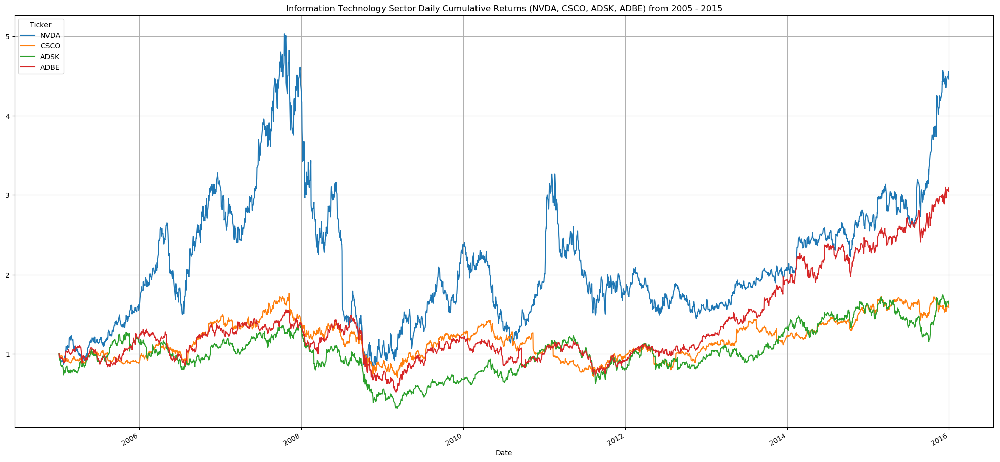

In [178]:
# Display information technology sector data.
information_technology_sector.plot(figsize=(25, 12), grid=True)
plt.title('Information Technology Sector Daily Cumulative Returns (NVDA, CSCO, ADSK, ADBE) from 2005 - 2015')

Text(0.5,1,'Health Care Sector Daily Cumulative Returns (ABT, ZBH, JNJ, BAX) from 2005 - 2015')

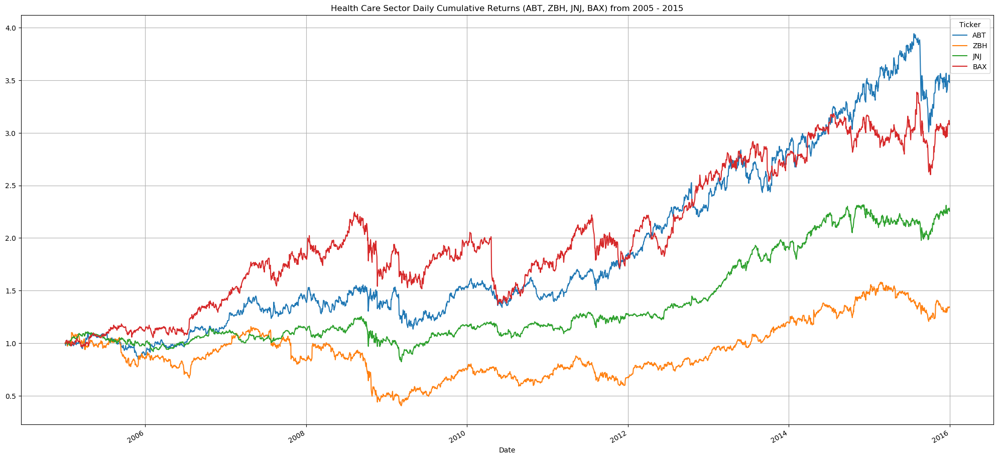

In [179]:
# Display health care sector data.
health_care_sector.plot(figsize=(25, 12), grid=True)
plt.title('Health Care Sector Daily Cumulative Returns (ABT, ZBH, JNJ, BAX) from 2005 - 2015')

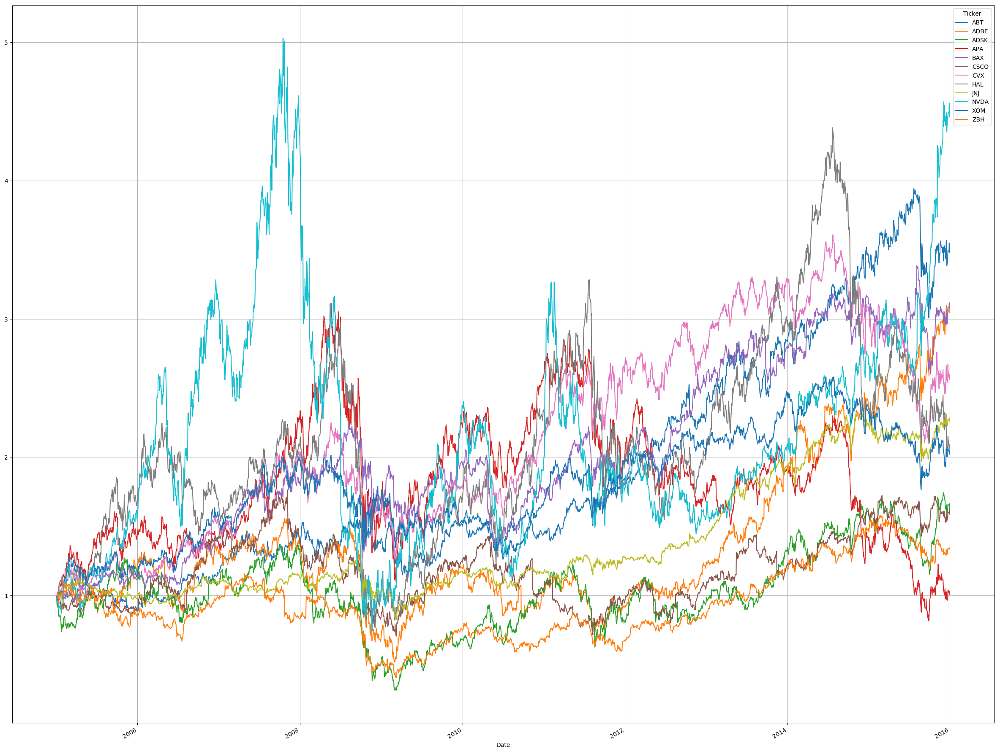

In [180]:
# Plot cumulative returns for all sectors.
daily_cumulative_returns.plot(figsize=(30, 25), grid=True)
# Opening the image in a new tab will display the chart in a fuller view.

## Histograms

**These display the distribution of daily returns for a specific stock.**

**More Information: https://www.saferpak.com/histogram_articles/howto_histogram.pdf**

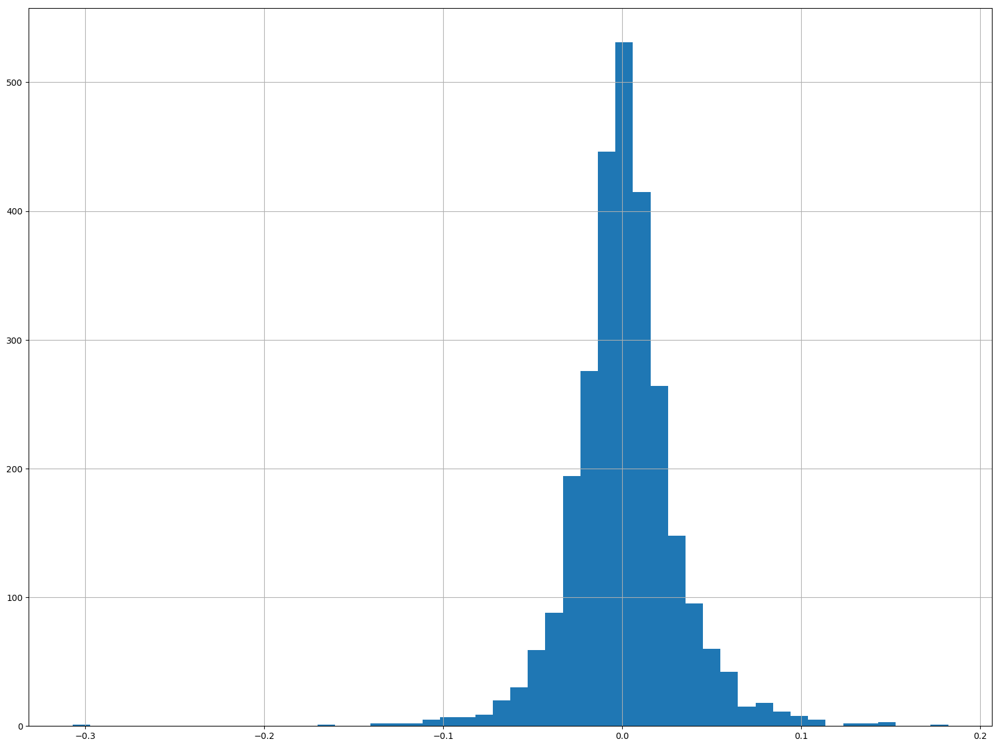

In [181]:
# Obtaining daily percentage change data for Nvidia stock.
nvda = daily_percentage_change_for_stock_data['NVDA']
# x-axis bins are set to 50
nvda.hist(bins=50, figsize=(20, 15))

In [182]:
# Display summary statistics that describe the histogram.
nvda.describe()

count    2769.00000
mean        0.00099
std         0.02993
min        -0.30727
25%        -0.01414
50%         0.00052
75%         0.01513
max         0.18209
Name: NVDA, dtype: float64

In [183]:
# Obtain information regarding specific percentiles.
nvda.describe(percentiles=[0.05, 0.30, 0.65, 0.95])

count    2769.00000
mean        0.00099
std         0.02993
min        -0.30727
5%         -0.04374
30%        -0.01045
50%         0.00052
65%         0.00862
95%         0.04907
max         0.18209
Name: NVDA, dtype: float64

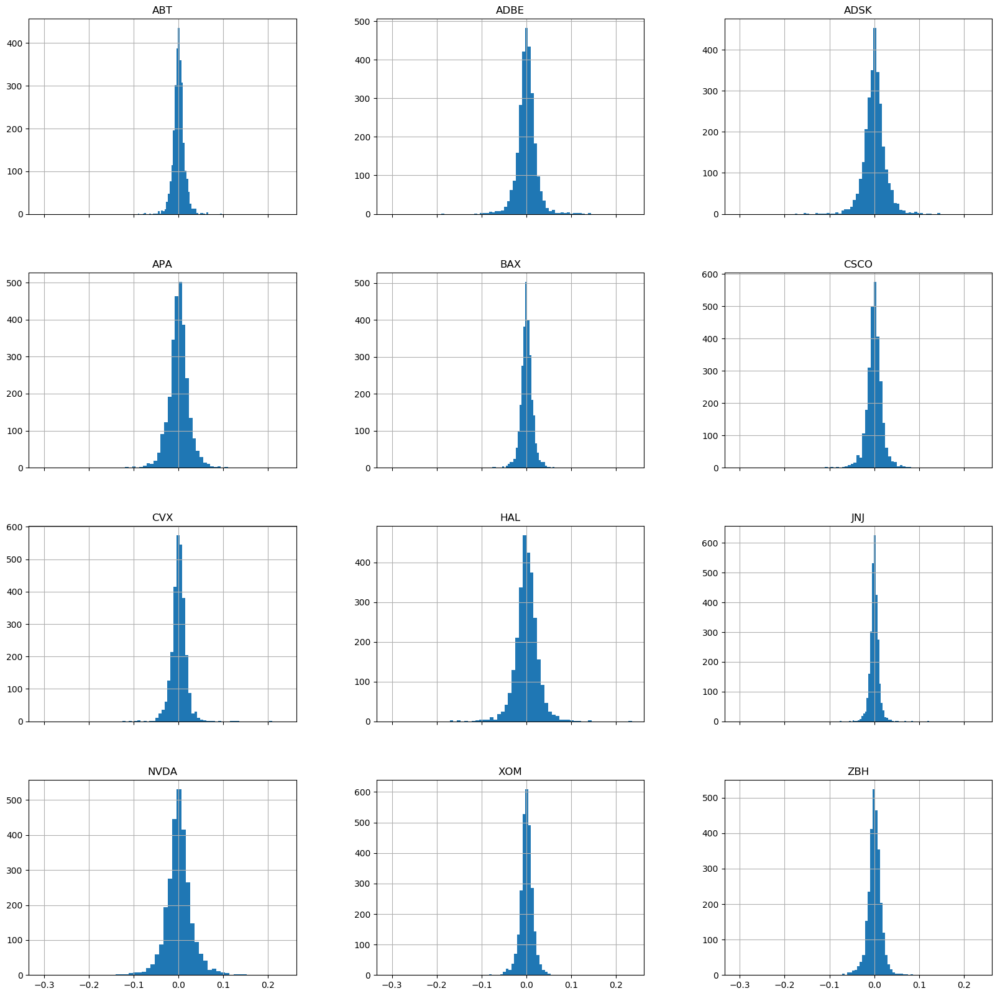

In [184]:
# Visualization of all stock distributions.
# Stocks that have a wider distribution in returns are more volatile due to their higher fluctuations.
daily_percentage_change_for_stock_data.hist(bins=50, sharex=True, figsize=(20, 20));

## Q-Q Plots

**Quantile-Quantile plots are probability plots that compare two distributions by having their quantiles plotted against each other.**

**More Information: http://data.library.virginia.edu/understanding-q-q-plots/**

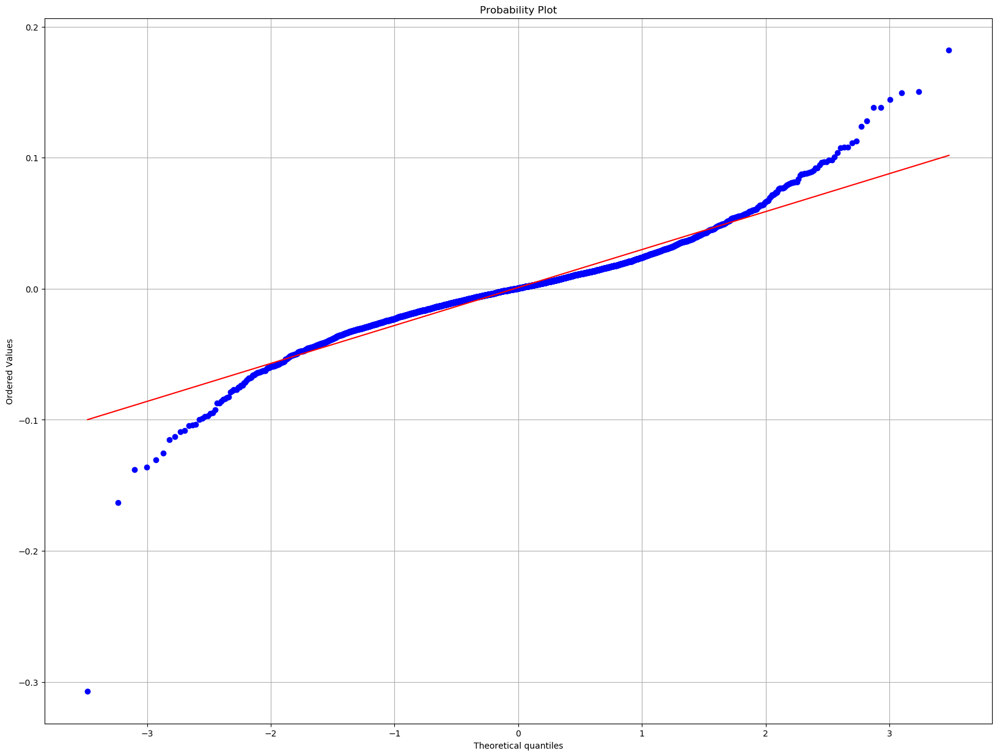

In [189]:
# Plot the returns of NVDA against some random normal values to determine how close the returns are to a normal distribution.
import scipy.stats as stats
figure = plt.figure(figsize=(20, 15))
axis = figure.add_subplot(111)
stats.probplot(nvda, dist='norm', plot=axis)
axis.grid(True)
plt.show()

**Information on interpreting Q-Q plots: https://stats.stackexchange.com/questions/101274/how-to-interpret-a-qq-plot**

## Box-and-whisker Plots

**Represents selections of data by their quartiles.**

**More Information: http://asq.org/learn-about-quality/data-collection-analysis-tools/overview/box-whisker-plot.html**

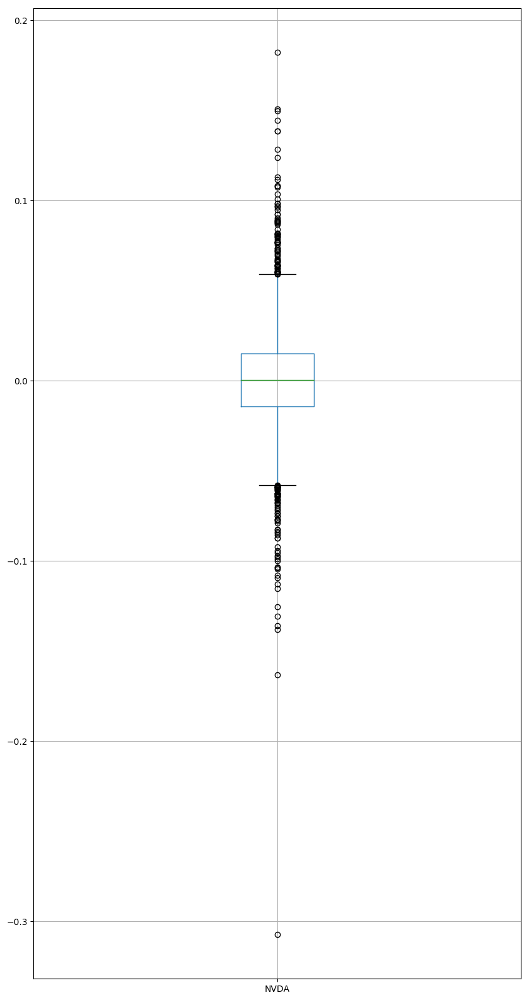

In [91]:
# Create box-and-whisker plot for Nvidia daily percentage changes. 
daily_percentage_change_for_stock_data[['NVDA']].plot(kind='box', figsize=(10, 20), grid=True);

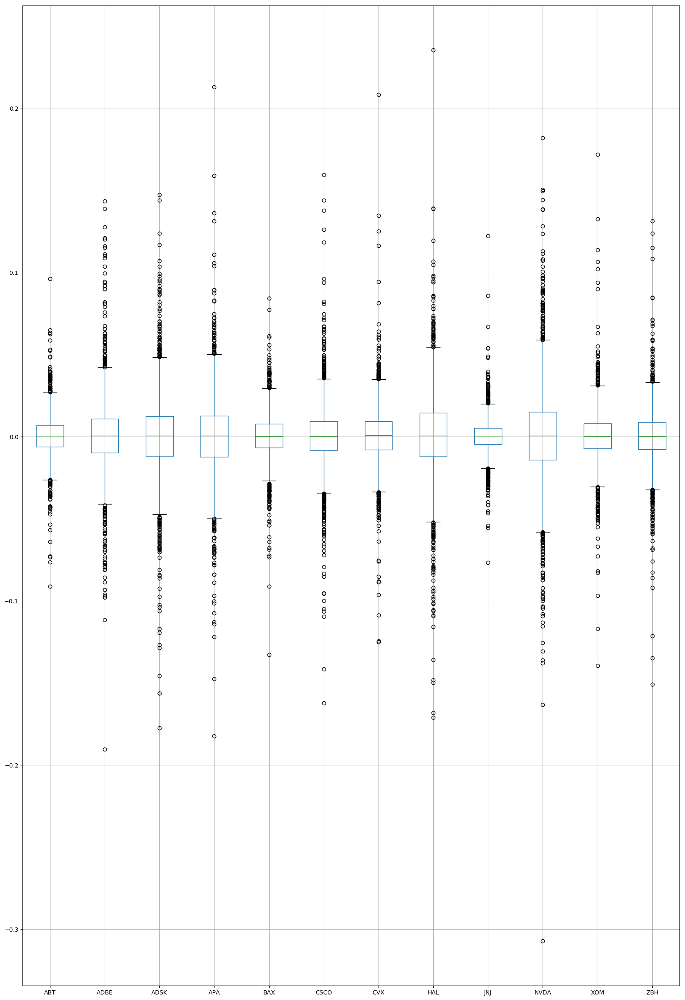

In [92]:
# Plot the distributions for all of the stocks.
# The more volitile stocks will display a wider box.
daily_percentage_change_for_stock_data.plot(kind='box', figsize=(20, 30), grid=True);

## Scatter Plots

**Determining the correlation between two stock's daily percentage rates of change in prices can be done through scatter plots.**

**More Information: https://www.statcan.gc.ca/edu/power-pouvoir/ch9/scatter-nuages/5214827-eng.htm**

In [144]:
# This function will plot the values from two stocks.
def display_scatter_plot(stock_data, x_stock, y_stock, x_limit = None, y_limit = None):
    figure = plt.figure(figsize=(20, 15))
    axis = figure.add_subplot(111)
    axis.scatter(stock_data[x_stock], stock_data[y_stock])
    if x_limit is not None:
        ax.set_xlim(x_limit)
    axis.autoscale(False)
    axis.vlines(0, -10, 10)
    axis.hlines(0, -10, 10)
    axis.plot((-10, 10), (-10, 10))
    axis.set_xlabel(x_stock)
    axis.set_ylabel(y_stock)

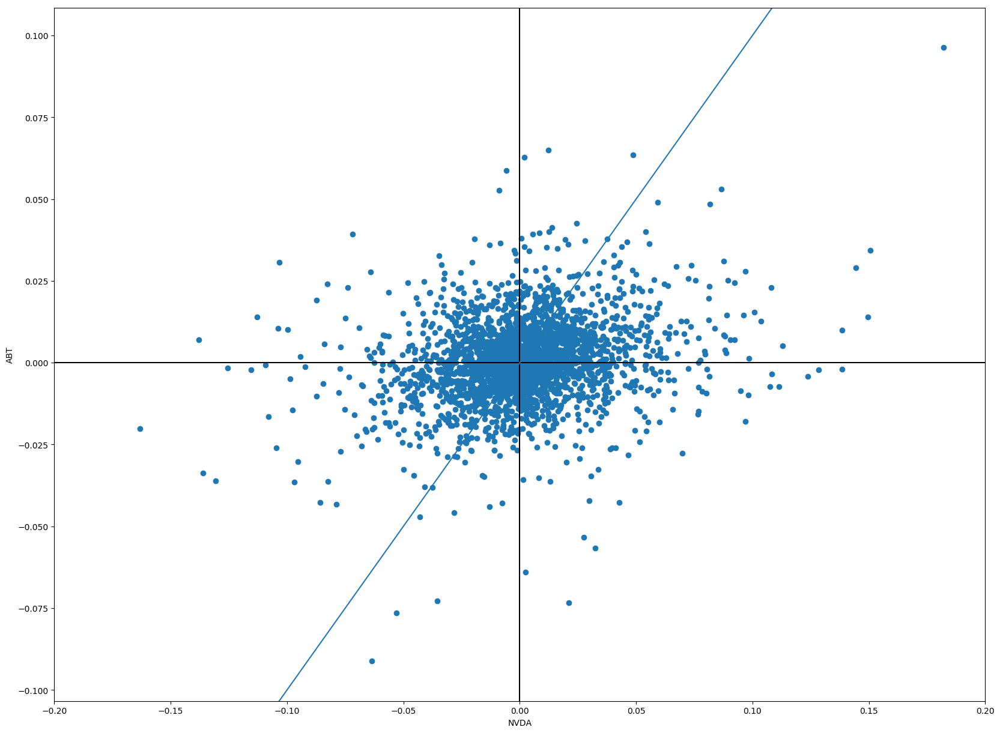

In [94]:
limits = [-0.20, 0.20]
# Comparing NVDA and ABT will result in a plot that shows virtually no correlation and quite a few outliers.
display_scatter_plot(daily_percentage_change_for_stock_data, 'NVDA', 'ABT', x_limit=limits)

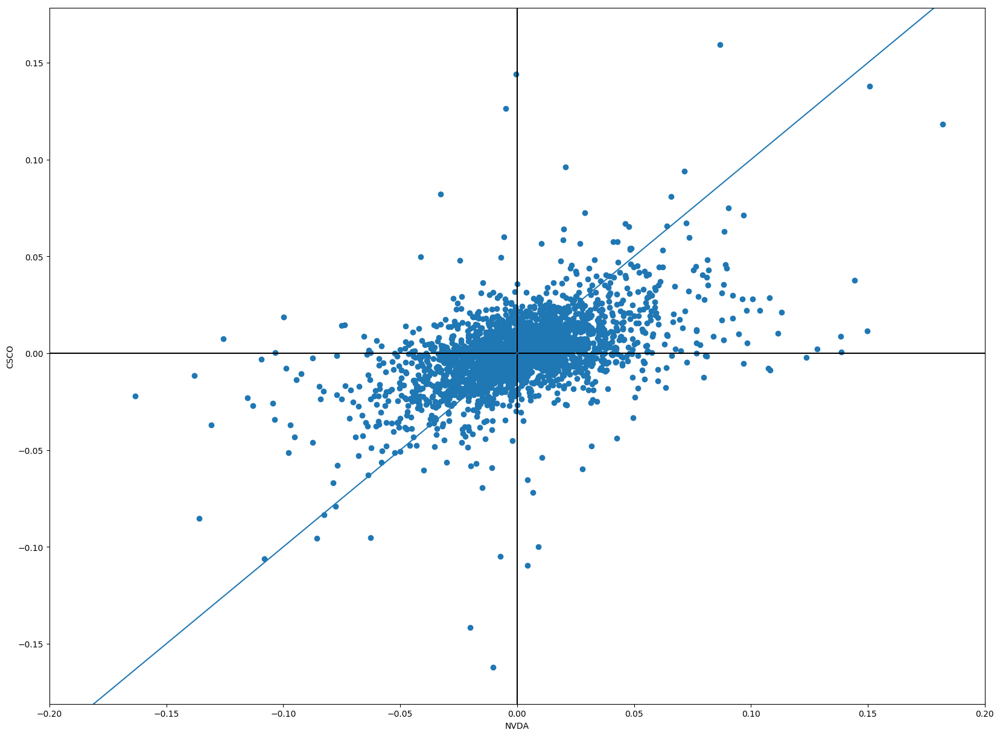

In [95]:
# This comparison shows a more slightly prominent positive correlation.
display_scatter_plot(daily_percentage_change_for_stock_data, 'NVDA', 'CSCO', x_limit=limits)

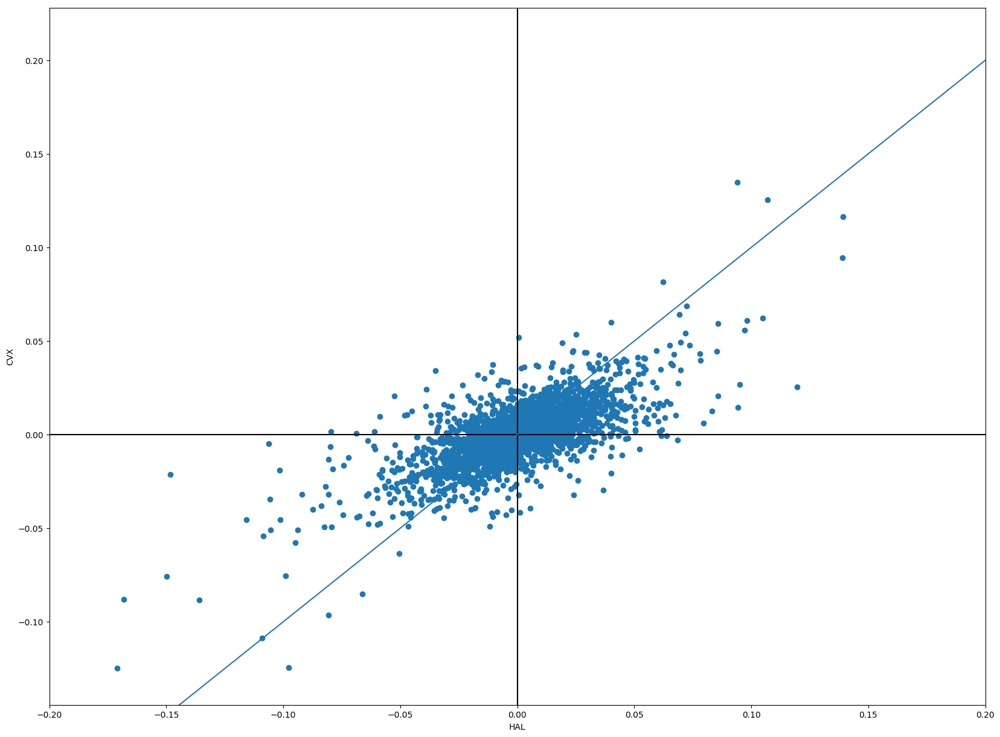

In [96]:
# An even greater positive correlation.
display_scatter_plot(daily_percentage_change_for_stock_data, 'HAL', 'CVX', x_limit=limits)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000020504D666A0>,
      dtype=object)

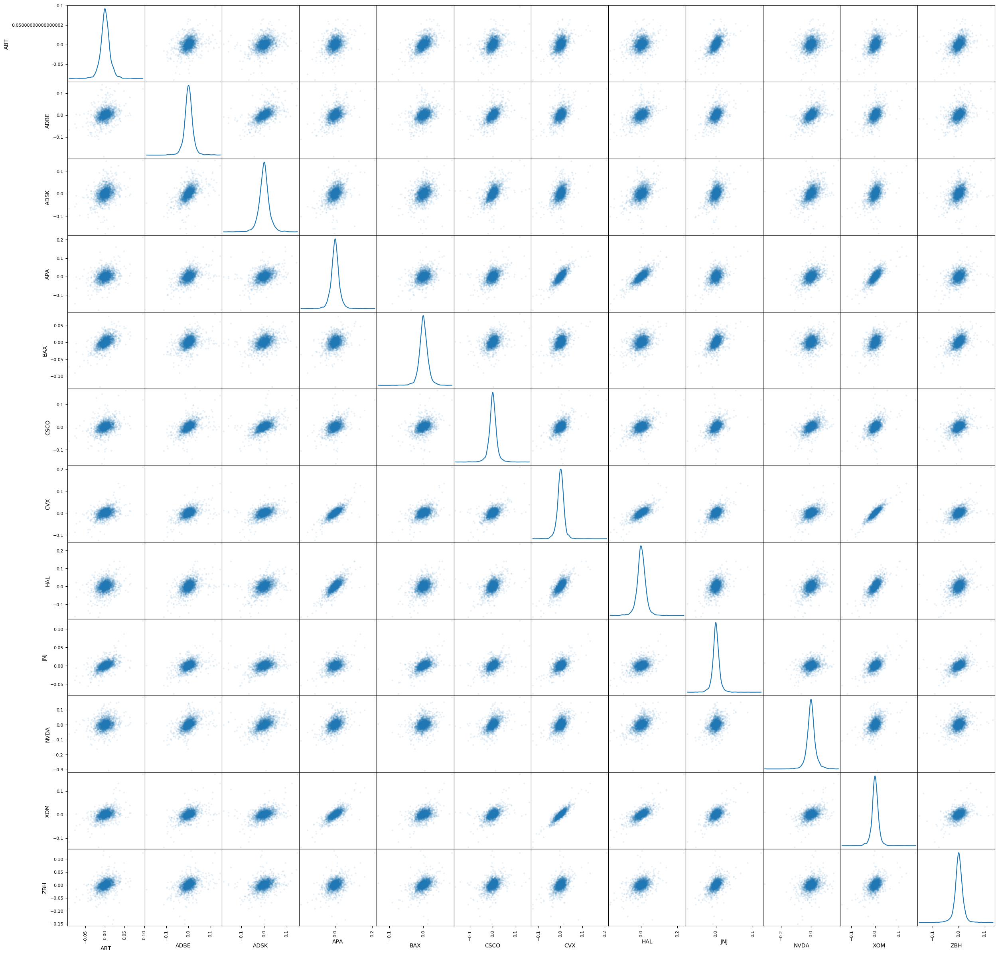

In [97]:
# Comparing all stock relationships against each other to view the various combinations.
# Output may display textual information before final image so scroll down to see the result.
pd.plotting.scatter_matrix(daily_percentage_change_for_stock_data, diagonal='kde', alpha=0.1, figsize=(30, 30))

## Data Segmentation and Rolling Statistics

**The Pandas library contains a number of functions that allows for the segmentation of data and the calculation of rolling statistics.**

**More information: https://www.investopedia.com/university/movingaverage/movingaverages1.asp**

**Documentation: https://pandas.pydata.org/pandas-docs/stable/api.html#standard-moving-window-functions**

In [100]:
# Obtain the adjusted closing values for Nvidia from 2010
# If "KeyError: 'Adj Close'" occurs then rerun the first cell after the imports that defines the nvda variable.
nvda_adjusted_closing_2010 = nvda['2010']['Adj Close']
nvda_adjusted_closing_2010.head()

Date
2010-01-04    17.13273
2010-01-05    17.38291
2010-01-06    17.49409
2010-01-07    17.15125
2010-01-08    17.18832
Name: Adj Close, dtype: float64

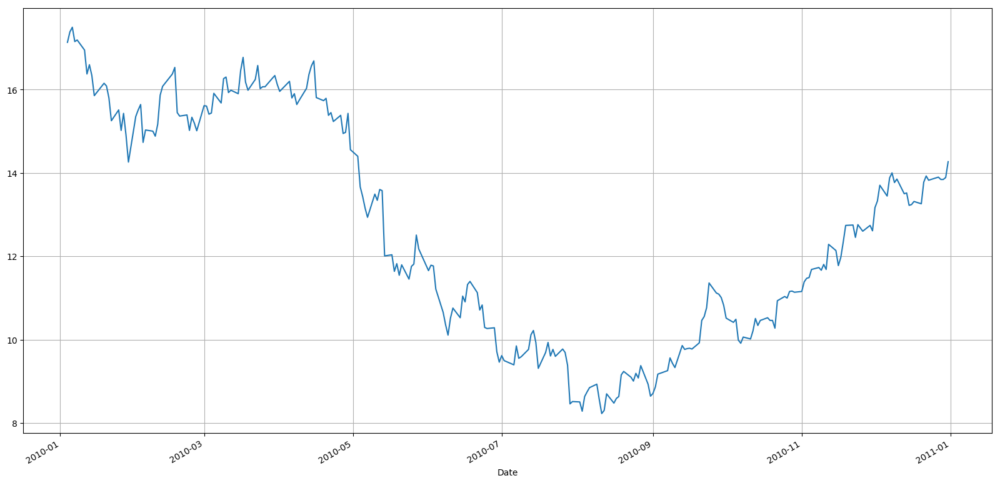

In [101]:
nvda_subset_2010 = nvda_adjusted_closing_2010['2010']
nvda_subset_2010.plot(figsize=(20, 10), grid=True)

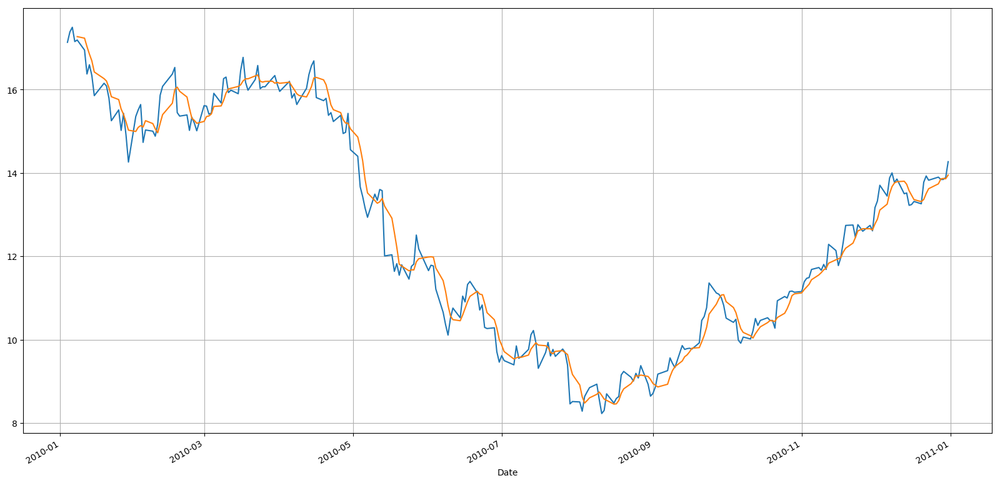

In [102]:
# Plot the rolling mean with five periods against the data above.
nvda_subset_2010.plot(figsize=(20, 10))
nvda_subset_2010.rolling(window=5).mean().plot(grid=True)

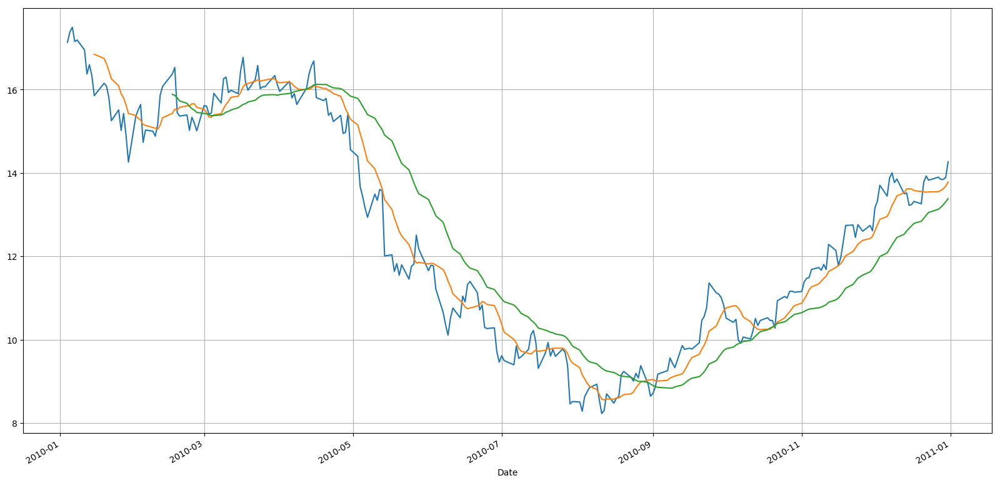

In [103]:
# Increasing the window value will result in a smoother line but with less accuracy.
nvda_subset_2010.plot(figsize=(20, 10))
nvda_subset_2010.rolling(window=10).mean().plot(grid=True)
nvda_subset_2010.rolling(window=30).mean().plot(grid=True)

**There is also a rolling correlation function that can be used to find how the correlation between two stocks has changed over time.**

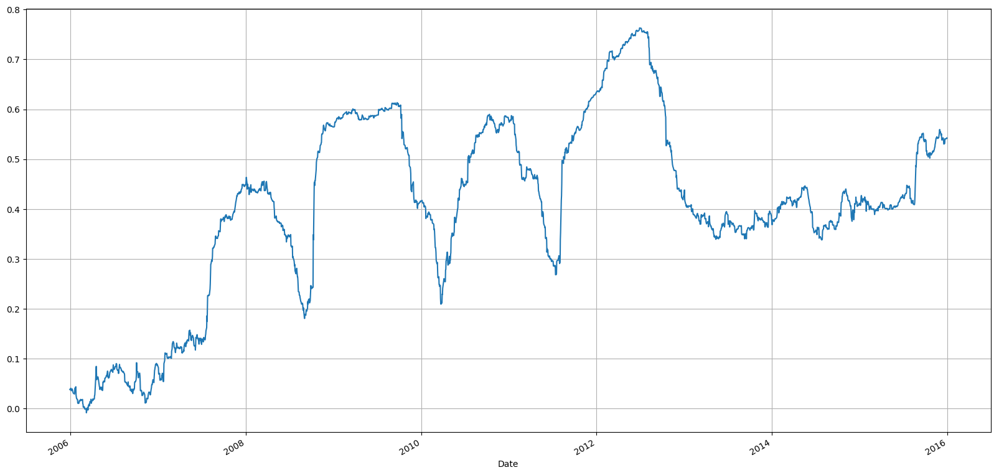

In [104]:
# Calculate and visualize the change in correlation between ABT and XOM based on their daily percentage returns.
# '\' is used to split the code for readability 
rolling_correlation_ABT_XOM = daily_percentage_change_for_stock_data.ABT. \
    rolling(window=252).corr(other=daily_percentage_change_for_stock_data.XOM).dropna() # 252 for an annualized period
rolling_correlation_ABT_XOM.plot(figsize=(20, 10), grid=True)

## Stock Volatility and Ordinary Least Squares Regression 

**A stock's volatility, or risk, can be determined by analyzing its fluctuating variance over a time period.**

**More information: https://www.investopedia.com/terms/v/volatility.asp**

**Beta: https://www.investopedia.com/terms/b/beta.asp**

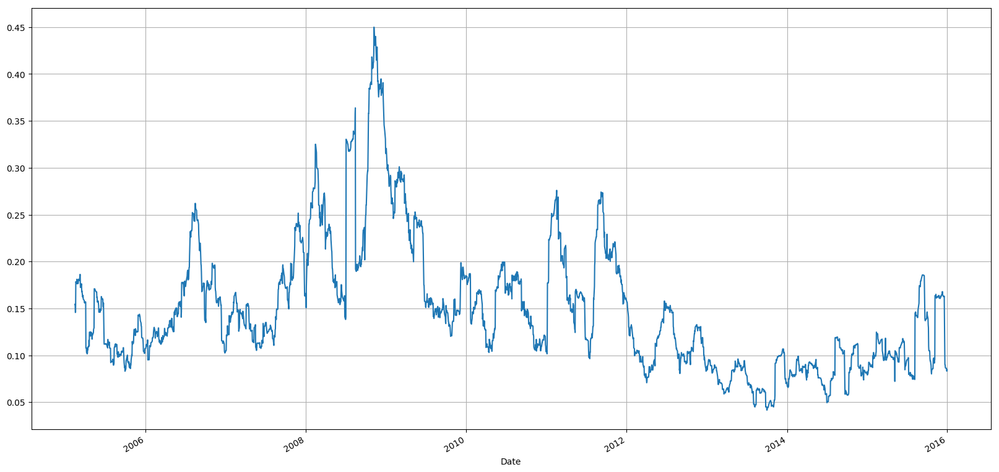

In [105]:
# Calculate volatility for Nvidia with 30 day windows.
nvda_volatility_30 = daily_percentage_change_for_stock_data.NVDA.rolling(window=30).std() * np.sqrt(30)
nvda_volatility_30.plot(figsize=(20, 10), grid=True);

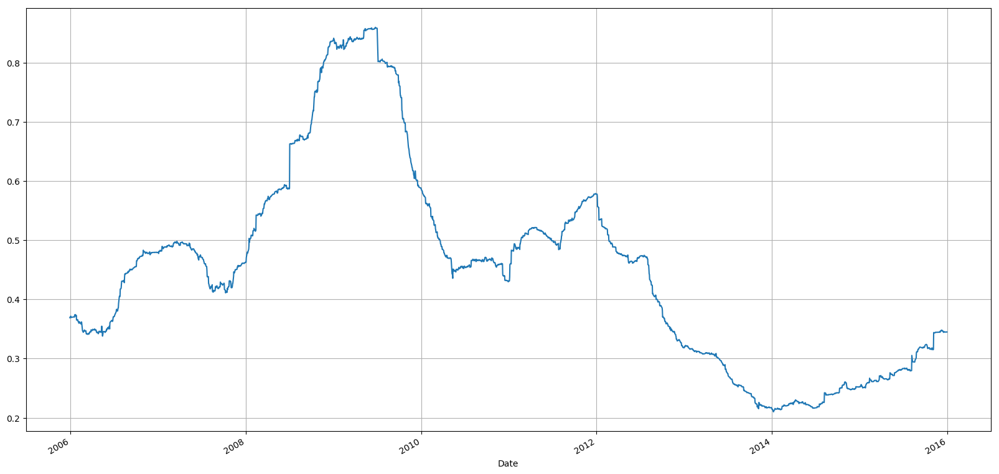

In [106]:
# Calculate annualized volatility for Nvidia.
nvda_volatility_annualized = daily_percentage_change_for_stock_data.NVDA.rolling(window=252).std() * np.sqrt(252)
nvda_volatility_annualized.plot(figsize=(20, 10), grid=True);

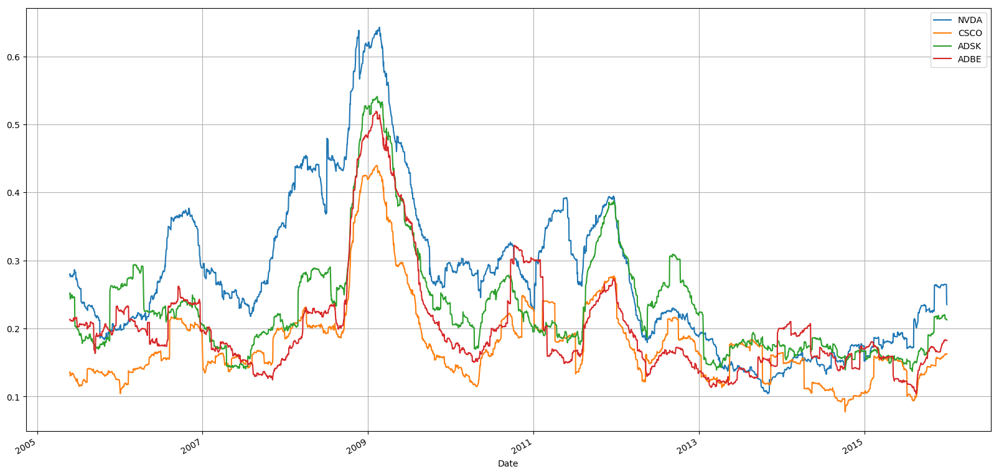

In [107]:
# Comparing volatility in the information technology sector given a window of 100 days. 
nvda_volatility = daily_percentage_change_for_stock_data.NVDA.rolling(window=100).std() * np.sqrt(100)
csco_volatility = daily_percentage_change_for_stock_data.CSCO.rolling(window=100).std() * np.sqrt(100)
adsk_volatility = daily_percentage_change_for_stock_data.ADSK.rolling(window=100).std() * np.sqrt(100)
adbe_volatility = daily_percentage_change_for_stock_data.ADBE.rolling(window=100).std() * np.sqrt(100)

nvda_volatility.plot(figsize=(20, 10), grid=True);
csco_volatility.plot(figsize=(20, 10), grid=True);
adsk_volatility.plot(figsize=(20, 10), grid=True);
adbe_volatility.plot(figsize=(20, 10), grid=True);
plt.legend()

**The Python package pyfinance contains an ordinary least squares function that can be used to calculate the change in volatility between two stocks.**

**More Information: https://www.investopedia.com/terms/l/least-squares-method.asp**

**Documentation: https://pypi.python.org/pypi/pyfinance**

In [130]:
from pyfinance.ols import PandasRollingOLS
pd.set_option('display.max_rows', 15) 

# NVDA and XOM are used in this example.
model = PandasRollingOLS(y=daily_percentage_change_for_stock_data.NVDA, x=daily_percentage_change_for_stock_data.XOM, window=200)
# The coefficients
model.beta

,feature1
Date,
2005-10-17,0.34730
2005-10-18,0.35003
2005-10-19,0.33718
2005-10-20,0.32551
2005-10-21,0.32973
2005-10-24,0.33595
2005-10-25,0.33628
...,...
2015-12-22,0.52627


In [131]:
# R-squared
model.rsq

Date
2005-10-17    0.04629
2005-10-18    0.04903
2005-10-19    0.04661
2005-10-20    0.04462
2005-10-21    0.04569
2005-10-24    0.04799
2005-10-25    0.04810
               ...   
2015-12-22    0.11310
2015-12-23    0.11070
2015-12-24    0.11071
2015-12-28    0.11080
2015-12-29    0.11063
2015-12-30    0.11258
2015-12-31    0.11916
Name: rsq, Length: 2570, dtype: float64

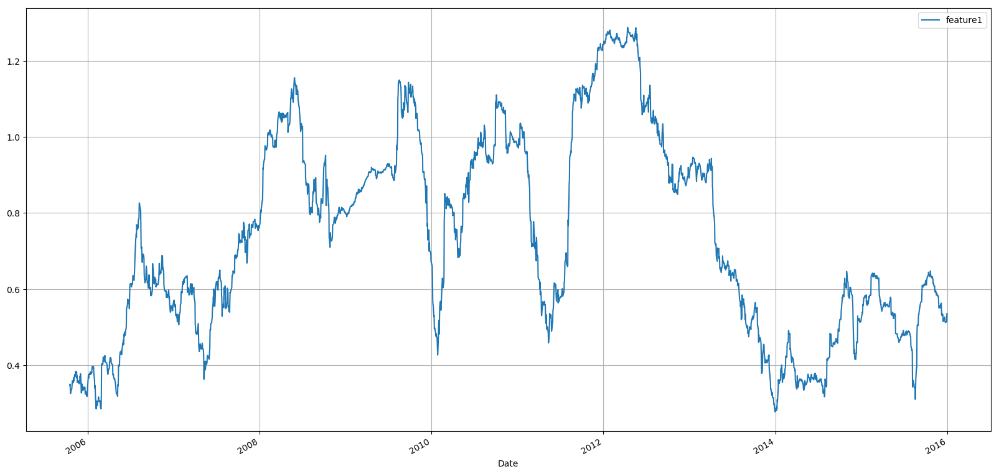

In [132]:
model.beta.plot(figsize=(20, 10), grid=True)

**An alternative using the Python module statsmodels.**

**More Information: http://www.statsmodels.org/dev/examples/notebooks/generated/ols.html**

**Documentation: http://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.html**

In [133]:
import statsmodels.api as sm

model2 = sm.OLS(daily_percentage_change_for_stock_data['NVDA'], daily_percentage_change_for_stock_data['XOM'])
fit = model2.fit()

In [134]:
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   NVDA   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.178
Method:                 Least Squares   F-statistic:                     600.5
Date:                Sun, 15 Apr 2018   Prob (F-statistic):          3.40e-120
Time:                        19:57:15   Log-Likelihood:                 6058.0
No. Observations:                2769   AIC:                        -1.211e+04
Df Residuals:                    2768   BIC:                        -1.211e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
XOM            0.7990      0.033     24.506      0.000       0.735       0.863
==============================================================================
Omnibus:                      562.879   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11104.735
Skew:                          -0.422   Prob(JB):                         0.00
Kurtosis:                      12.774   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Comparisions with the S&P 500 market index

**Comparing stocks against the Standard & Poor's 500 Index will demonstrate to some degree how certain securities compare to market as a whole.**

**More Information: https://www.investopedia.com/ask/answers/040215/what-does-sp-500-index-measure-and-how-it-calculated.asp**

In [135]:
# Calculate the daily percentage change for the S&P 500 data obtain earlier on in the beginning of this section.
sp500_daily_percentage_change = sp500['Adj Close'].pct_change().fillna(0)
sp500_daily_percentage_change

Date
2005-01-03    0.00000
2005-01-04   -0.01167
2005-01-05   -0.00363
2005-01-06    0.00351
2005-01-07   -0.00143
2005-01-10    0.00342
2005-01-11   -0.00610
               ...   
2015-12-22    0.00882
2015-12-23    0.01242
2015-12-24   -0.00160
2015-12-28   -0.00218
2015-12-29    0.01063
2015-12-30   -0.00722
2015-12-31   -0.00941
Name: Adj Close, Length: 2769, dtype: float64

In [136]:
# Combine daily percentage change for all of the stock data with the daily percentage change for the S&P 500 in a new DataFrame.
daily_percentage_change_stocks_sp500 = pd.concat([sp500_daily_percentage_change, 
                                                  daily_percentage_change_for_stock_data], axis=1)
daily_percentage_change_stocks_sp500.rename(columns={'Adj Close': 'SP500'}, inplace=True)
daily_percentage_change_stocks_sp500

,SP500,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,,
2005-01-03,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
2005-01-04,-0.01167,-0.01007,-0.02642,-0.06492,-0.00808,-0.00202,-0.03934,-0.00688,0.00105,-0.00318,-0.04707,-0.00679,-0.00038
2005-01-05,-0.00363,-0.01147,-0.00549,0.00771,-0.00334,0.01071,0.00054,0.00653,-0.01261,-0.00064,0.00935,-0.00523,-0.00781
2005-01-06,0.00351,0.02255,-0.01657,-0.00482,0.01613,0.00401,0.01508,0.01671,0.01783,0.00287,-0.00970,0.01273,0.01156
2005-01-07,-0.00143,0.01713,0.00068,-0.02279,-0.00639,0.01198,-0.00690,-0.01121,-0.00706,-0.00366,-0.01915,-0.00658,-0.00176
2005-01-10,0.00342,0.00968,0.00068,-0.00175,0.00706,-0.00141,0.00000,0.00450,-0.00369,0.00783,0.00227,0.00382,0.00956
2005-01-11,-0.00610,-0.01835,-0.01190,-0.05403,0.00865,0.00367,-0.00427,0.00039,0.00925,-0.00349,-0.03080,-0.00260,-0.00424
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-22,0.00882,0.00999,0.02401,0.01380,0.00588,0.02563,0.00938,0.01154,0.01856,0.01112,0.00091,0.00505,0.01497


In [137]:
# Calculate cumulative daily returns.
cumulative_daily_returns_stocks_sp500 = (1 + daily_percentage_change_stocks_sp500).cumprod()
cumulative_daily_returns_stocks_sp500

,SP500,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
Date,,,,,,,,,,,,,
2005-01-03,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000,1.00000
2005-01-04,0.98833,0.98993,0.97358,0.93508,0.99192,0.99798,0.96066,0.99312,1.00105,0.99682,0.95293,0.99321,0.99962
2005-01-05,0.98474,0.97857,0.96823,0.94229,0.98861,1.00867,0.96118,0.99961,0.98843,0.99618,0.96183,0.98802,0.99181
2005-01-06,0.98820,1.00064,0.95218,0.93775,1.00456,1.01271,0.97567,1.01631,1.00605,0.99905,0.95250,1.00060,1.00328
2005-01-07,0.98678,1.01778,0.95283,0.91638,0.99814,1.02484,0.96894,1.00491,0.99895,0.99539,0.93427,0.99401,1.00151
2005-01-10,0.99016,1.02764,0.95348,0.91477,1.00518,1.02340,0.96894,1.00943,0.99527,1.00318,0.93639,0.99780,1.01109
2005-01-11,0.98412,1.00879,0.94213,0.86535,1.01388,1.02715,0.96480,1.00982,1.00447,0.99968,0.90755,0.99521,1.00680
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-22,1.69620,3.44475,3.04282,1.63028,0.97137,3.04179,1.57182,2.57078,2.06339,2.25480,4.45827,2.01430,1.32816


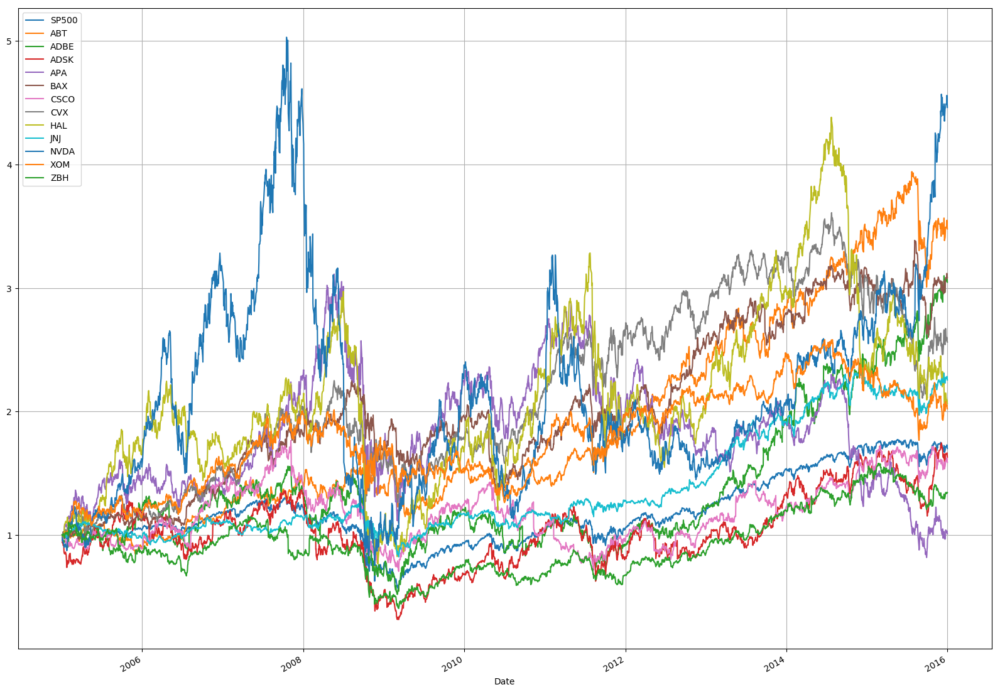

In [138]:
# Plot the cumulative daily returns with all of the data.
cumulative_daily_returns_stocks_sp500.plot(figsize=(20, 15), grid=True)

In [139]:
# Calculate the correlation of all available daily values.
pd.options.display.max_columns = None 
pd.options.display.max_rows = None
dpc_stocks_sp500_correlation = daily_percentage_change_stocks_sp500.corr()
dpc_stocks_sp500_correlation

,SP500,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
SP500,1.00000,0.56119,0.65750,0.63407,0.68172,0.55758,0.70041,0.77765,0.67596,0.68803,0.58510,0.77250,0.58259
ABT,0.56119,1.00000,0.33440,0.34168,0.31892,0.52025,0.35016,0.42395,0.29182,0.57924,0.24055,0.43492,0.41513
ADBE,0.65750,0.33440,1.00000,0.54941,0.43664,0.34671,0.49592,0.47155,0.42837,0.43060,0.46472,0.45902,0.38471
ADSK,0.63407,0.34168,0.54941,1.00000,0.41521,0.34228,0.48192,0.44603,0.41533,0.40944,0.43760,0.43533,0.36487
APA,0.68172,0.31892,0.43664,0.41521,1.00000,0.34387,0.43892,0.76775,0.74690,0.41514,0.42495,0.73867,0.37388
BAX,0.55758,0.52025,0.34671,0.34228,0.34387,1.00000,0.36064,0.43359,0.34643,0.51461,0.27813,0.43773,0.43245
CSCO,0.70041,0.35016,0.49592,0.48192,0.43892,0.36064,1.00000,0.50200,0.44216,0.45701,0.50069,0.50668,0.39180
CVX,0.77765,0.42395,0.47155,0.44603,0.76775,0.43359,0.50200,1.00000,0.71785,0.53974,0.42482,0.88066,0.43236
HAL,0.67596,0.29182,0.42837,0.41533,0.74690,0.34643,0.44216,0.71785,1.00000,0.40524,0.44490,0.68503,0.38891
JNJ,0.68803,0.57924,0.43060,0.40944,0.41514,0.51461,0.45701,0.53974,0.40524,1.00000,0.31935,0.55965,0.50389


In [118]:
# Display the data in a more formated way.
from IPython.display import display, HTML
display(HTML(dpc_stocks_sp500_correlation.to_html()))

,SP500,ABT,ADBE,ADSK,APA,BAX,CSCO,CVX,HAL,JNJ,NVDA,XOM,ZBH
SP500,1.00000,0.56119,0.65750,0.63407,0.68172,0.55758,0.70041,0.77765,0.67596,0.68803,0.58510,0.77250,0.58259
ABT,0.56119,1.00000,0.33440,0.34168,0.31892,0.52025,0.35016,0.42395,0.29182,0.57924,0.24055,0.43492,0.41513
ADBE,0.65750,0.33440,1.00000,0.54941,0.43664,0.34671,0.49592,0.47155,0.42837,0.43060,0.46472,0.45902,0.38471
ADSK,0.63407,0.34168,0.54941,1.00000,0.41521,0.34228,0.48192,0.44603,0.41533,0.40944,0.43760,0.43533,0.36487
APA,0.68172,0.31892,0.43664,0.41521,1.00000,0.34387,0.43892,0.76775,0.74690,0.41514,0.42495,0.73867,0.37388
BAX,0.55758,0.52025,0.34671,0.34228,0.34387,1.00000,0.36064,0.43359,0.34643,0.51461,0.27813,0.43773,0.43245
CSCO,0.70041,0.35016,0.49592,0.48192,0.43892,0.36064,1.00000,0.50200,0.44216,0.45701,0.50069,0.50668,0.39180
CVX,0.77765,0.42395,0.47155,0.44603,0.76775,0.43359,0.50200,1.00000,0.71785,0.53974,0.42482,0.88066,0.43236
HAL,0.67596,0.29182,0.42837,0.41533,0.74690,0.34643,0.44216,0.71785,1.00000,0.40524,0.44490,0.68503,0.38891
JNJ,0.68803,0.57924,0.43060,0.40944,0.41514,0.51461,0.45701,0.53974,0.40524,1.00000,0.31935,0.55965,0.50389


In [119]:
# Displaying the correlations of the S&P 500.
display(dpc_stocks_sp500_correlation.SP500)

SP500    1.00000
ABT      0.56119
ADBE     0.65750
ADSK     0.63407
APA      0.68172
BAX      0.55758
CSCO     0.70041
CVX      0.77765
HAL      0.67596
JNJ      0.68803
NVDA     0.58510
XOM      0.77250
ZBH      0.58259
Name: SP500, dtype: float64

CVX (0.778) had movements most comparable to the S&P while BAX (0.558) showed the least similarities.

These stocks can be plotted to visualize the differences in activity and their relationship to the S&P 500.

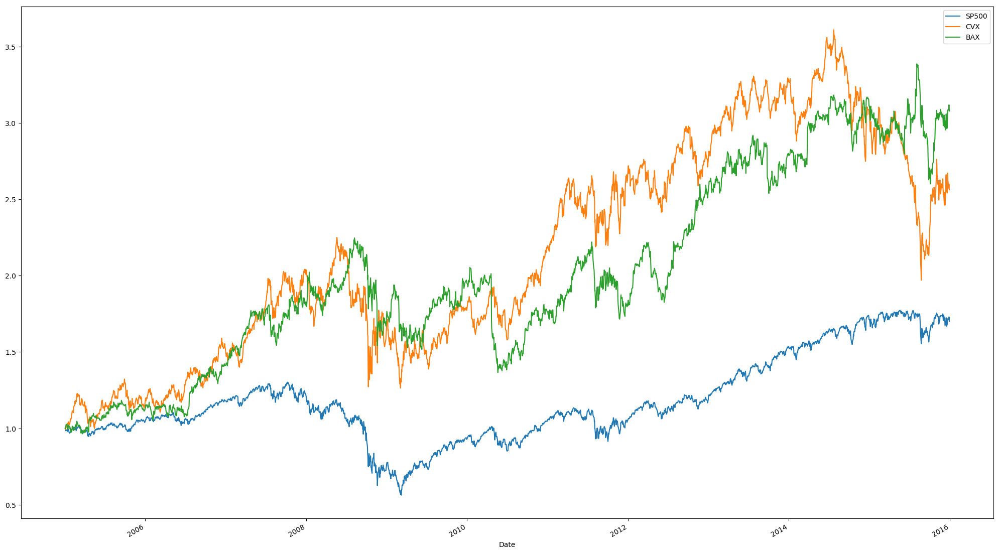

In [120]:
cumulative_daily_returns_stocks_sp500[['SP500', 'CVX', 'BAX']].plot(figsize=(25 ,15));

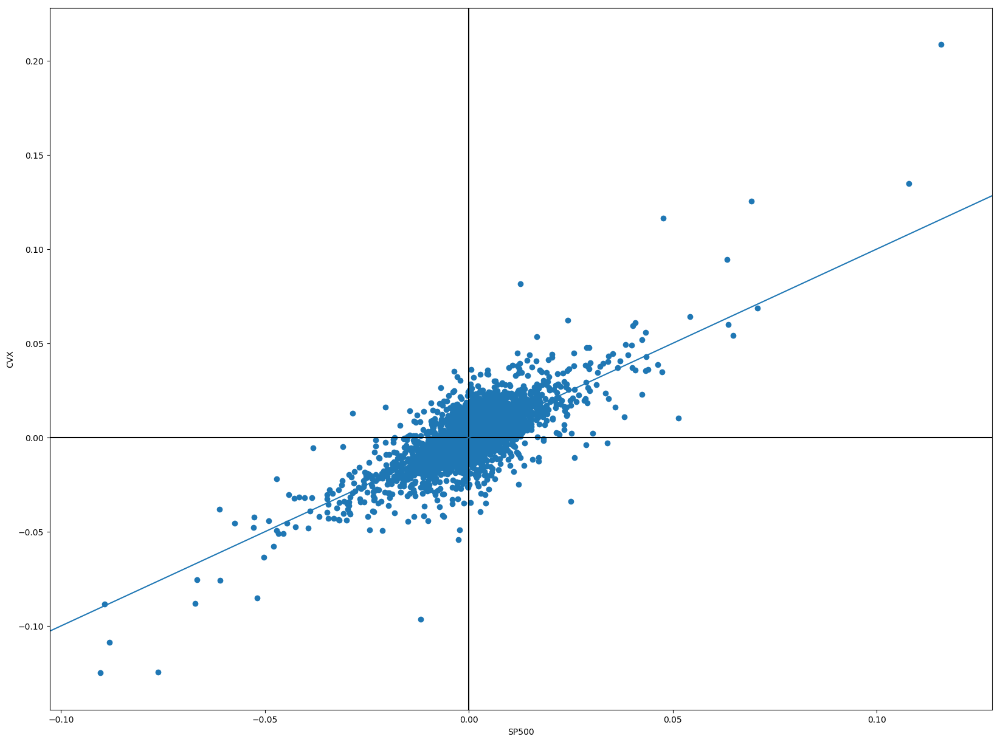

In [121]:
# The tighter distribution of points reflects the 0.778 correlation value. 
display_scatter_plot(daily_percentage_change_stocks_sp500, 'SP500', 'CVX')

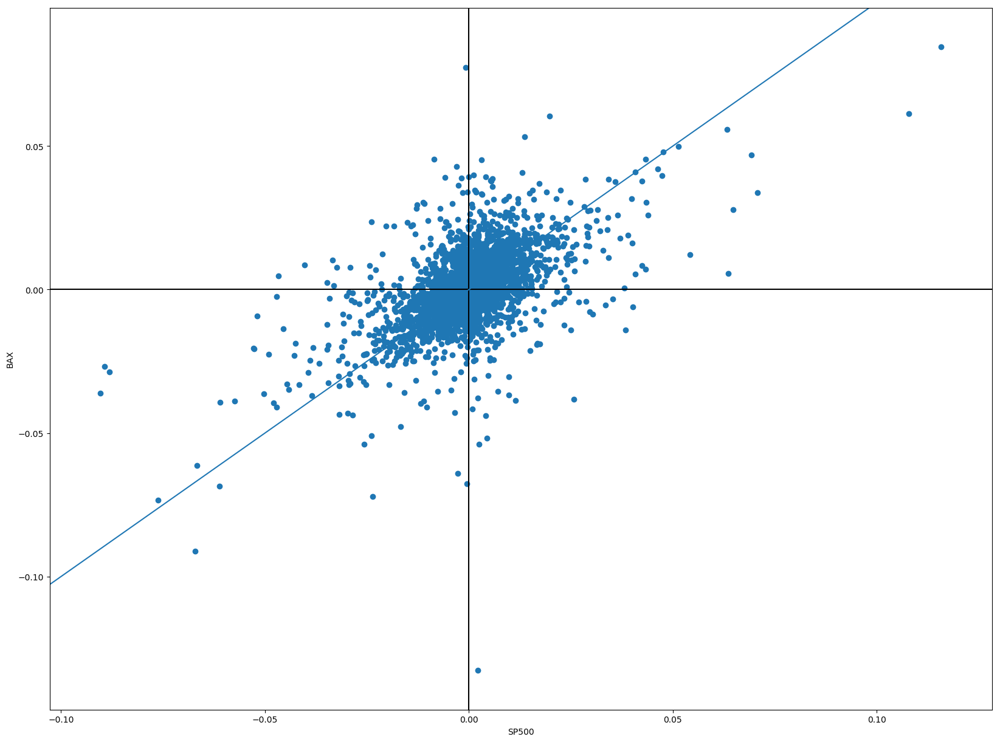

In [122]:
# The correlation is significantly less prominent for BAX given the wider distribution.
display_scatter_plot(daily_percentage_change_stocks_sp500, 'SP500', 'BAX')

In [123]:
# If executed after a plot creation then this command will save the resulting plot on the local machine.
# plt.savefig('Image.png', bbox_inches='tight', dpi=300)

## Alternative way to obtain data

**The data platform [Quandl](https://www.quandl.com/) can be used to access financial, economic, and alternative datasets in a variety of different formats.**

In [142]:
import quandl
pd.set_option('display.max_rows', 15) 

# An API key was set up for this project in order to give access to Quandl datasets. 
quandl.ApiConfig.api_key = 'Ny25TbU6ui7fgDhweAhR'

# Obtain London Stock Exchange Prices.
quandl.get('XLON/AEO', start_date='2007-07-11', end_date='2017-05-15')

,Open,High,Low,Close,Volume,Adjustment Factor,Adjustment Type
Date,,,,,,,
2007-07-11,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-12,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-13,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-16,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-17,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-18,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
2007-07-19,15.15123,15.15123,15.15123,15.15123,0.0,NaN,NaN
...,...,...,...,...,...,...,...
2017-05-05,27.48148,27.48148,27.48148,27.48148,837.0,NaN,NaN


In [143]:
# Get AMD stock data.
amd_stock = quandl.get('WIKI/AMD')
amd_stock

,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
1983-03-21,35.88,36.13,35.250,36.00,127700.0,0.0,1.0,8.96754,9.03003,8.81009,8.99753,510800.0
1983-03-22,34.88,35.88,34.000,34.00,82000.0,0.0,1.0,8.71761,8.96754,8.49767,8.49767,328000.0
1983-03-23,34.00,35.25,33.880,34.88,106800.0,0.0,1.0,8.49767,8.81009,8.46768,8.71761,427200.0
1983-03-24,34.88,35.13,34.630,35.13,98300.0,0.0,1.0,8.71761,8.78009,8.65513,8.78009,393200.0
1983-03-25,35.63,36.25,35.000,35.50,52600.0,0.0,1.0,8.90506,9.06002,8.74760,8.87257,210400.0
1983-03-28,35.38,36.13,34.630,34.75,123700.0,0.0,1.0,8.84258,9.03003,8.65513,8.68512,494800.0
1983-03-29,34.38,35.38,33.380,33.75,194500.0,0.0,1.0,8.59265,8.84258,8.34271,8.43519,778000.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-03-19,11.41,11.74,11.351,11.43,53034019.0,0.0,1.0,11.41000,11.74000,11.35100,11.43000,53034019.0


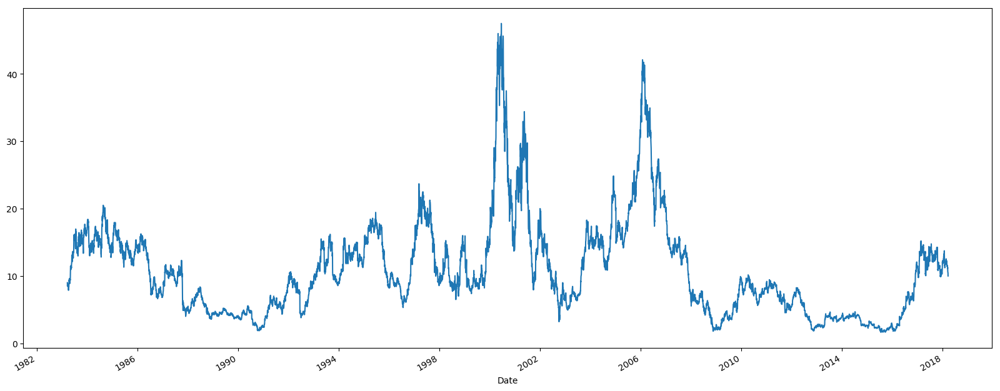

In [204]:
amd_stock['Adj. Close'].plot(figsize=(20, 8))

# Downloads the data locally into a csv file.
# amd_stock.to_csv('AMD_Stock.csv')

**More Information: https://www.quandl.com/tools/python**

**Documentation: https://docs.quandl.com/docs/getting-started**

## References
> AMERICAN SOCIETY FOR QUALITY. (n.d.). Box and Whisker Plot. Retrieved from asq.org: http://asq.org/learn-about-quality/data-collection-analysis-tools/overview/box-whisker-plot.html

> Ford, C. (2015, August 26). Understanding Q-Q Plots. Retrieved from http://data.library.virginia.edu: http://data.library.virginia.edu/understanding-q-q-plots/

> Glen_b. (2014, June 5). How to interpret a QQ plot. Retrieved from stats.stackexchange.com: https://stats.stackexchange.com/questions/101274/how-to-interpret-a-qq-plot

> Heydt, M. (2015). Mastering pandas for Finance. Birmingham, United Kingdom: Packt Publishing Ltd.

> Investopedia. (2015, April 2). What does the S&P 500 index measure and how is it calculated? Retrieved from investopedia.com: https://www.investopedia.com/ask/answers/040215/what-does-sp-500-index-measure-and-how-it-calculated.asp

> Investopedia. (2016, May 17). Least Squares Method. Retrieved from investopedia.com: https://www.investopedia.com/terms/l/least-squares-method.asp

> Investopedia. (2016, August 4). Volatility. Retrieved from investopedia.com: https://www.investopedia.com/terms/v/volatility.asp

> Investopedia. (2017, November 9). Beta. Retrieved from investopedia.com: https://www.investopedia.com/terms/b/beta.asp

> Investopedia. (2018, March 27). Cumulative Return. Retrieved from investopedia.com: https://www.investopedia.com/terms/c/cumulativereturn.asp

> Josef Perktold, S. S. (2017, February 9). Ordinary Least Squares, 0.8.0. Retrieved from statsmodels.org: http://www.statsmodels.org/dev/examples/notebooks/generated/ols.html

> Josef Perktold, S. S. (2017, February 9). statsmodels.regression.linear_model.OLS, 0.8.0. Retrieved from statsmodels.org: http://www.statsmodels.org/dev/generated/statsmodels.regression.linear_model.OLS.html

> Michael Droettboom, T. A. (2018, April 12). matplotlib.dates, 2.2.2. Retrieved from matplotlib.org: https://matplotlib.org/api/dates_api.html

> Murphy, C. (2018, April 2). Moving Averages: What Are They? Retrieved from investopedia.com: https://www.investopedia.com/university/movingaverage/movingaverages1.asp

> NumFOCUS. (2017, December 30). Standard moving window functions, 0.22.0. Retrieved from pandas.pydata.org: https://pandas.pydata.org/pandas-docs/stable/api.html#standard-moving-window-functions

> Python Software Foundation. (2018, February 9). Yahoo! Finance Fix for Pandas Datareader. Retrieved from pypi.python.org: https://pypi.python.org/pypi/fix-yahoo-finance

> Quandl. (2017). Get Financial Data Directly into Python. Retrieved from quandl.com: https://www.quandl.com/tools/python

> Quandl. (n.d.). How to get started with Quandl's API. Retrieved from docs.quandl.comauthor: https://docs.quandl.com/docs/getting-started

> Saferpak. (2003, Hune 16). Basic Tools for Process Improvement. Retrieved from saferpak.com: https://www.saferpak.com/histogram_articles/howto_histogram.pdf

> Solomon, B. (2018, March 27). pyfinance 1.0.1, 1.0.1. Retrieved from pypi.python.org: https://pypi.python.org/pypi/pyfinance
Statistics Canada. (2013, July 23). Scatterplots. Retrieved from statcan.gc.ca: https://www.statcan.gc.ca/edu/power-pouvoir/ch9/scatter-nuages/5214827-eng.htm

> StockCharts. (n.d.). Introduction to Candlesticks. Retrieved from stockcharts.com: http://stockcharts.com/school/doku.php?id=chart_school:chart_analysis:introduction_to_candlesticks